# Part 0: Camera Calibration and 3D Scanning - Testing

This notebook tests all Part 0 functionality:
- Part 0.1: Camera Calibration
- Part 0.3: Camera Pose Estimation
- Part 0.4: Dataset Creation

Using provided calibration images and lafufu dataset.


In [11]:
# Imports
import sys
import numpy as np
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

# Import functions from main.py
from main import *
print("Imports successful!")


Imports successful!


## Part 0.1: Camera Calibration

Calibrate the camera using the calibration images.


In [12]:
# Configuration
calibration_images_dir = "../images/calibration_images"
tag_size = 0.02  # 2cm in meters

print(f"Calibrating camera using images from: {calibration_images_dir}")
print(f"Tag size: {tag_size}m ({tag_size*100}cm)")

# Run calibration
camera_matrix, dist_coeffs, image_size, error = calibrate_camera(
    calibration_images_dir,
    tag_size=tag_size
)


Calibrating camera using images from: ../images/calibration_images
Tag size: 0.02m (2.0cm)
Found 34 images in ../images/calibration_images
Successfully processed 34 images with detected tags
Total tag detections: 204
Calibrating camera...
Calibration complete!
Reprojection error: 1.3208 pixels
Camera matrix:
[[3.58645870e+03 0.00000000e+00 2.94782639e+03]
 [0.00000000e+00 3.08486910e+03 2.20427718e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Distortion coefficients: [ 0.1910335  -1.20354748  0.0396675   0.00369298  1.59861646]


In [13]:
# Display calibration results
print("\n" + "="*60)
print("CALIBRATION RESULTS")
print("="*60)
print(f"\nImage Size: {image_size} (width x height)")
print(f"\nReprojection Error: {error:.4f} pixels")
print(f"\nCamera Matrix (K):")
print(camera_matrix)
print(f"\nDistortion Coefficients:")
print(dist_coeffs.flatten())
print(f"\nFocal Length (fx, fy): ({camera_matrix[0,0]:.2f}, {camera_matrix[1,1]:.2f})")
print(f"Principal Point (cx, cy): ({camera_matrix[0,2]:.2f}, {camera_matrix[1,2]:.2f})")

# Save calibration results
np.savez(
    'camera_calibration.npz',
    camera_matrix=camera_matrix,
    dist_coeffs=dist_coeffs,
    image_size=image_size,
    error=error
)
print("\n✓ Calibration results saved to 'camera_calibration.npz'")



CALIBRATION RESULTS

Image Size: (5712, 4284) (width x height)

Reprojection Error: 1.3208 pixels

Camera Matrix (K):
[[3.58645870e+03 0.00000000e+00 2.94782639e+03]
 [0.00000000e+00 3.08486910e+03 2.20427718e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

Distortion Coefficients:
[ 0.1910335  -1.20354748  0.0396675   0.00369298  1.59861646]

Focal Length (fx, fy): (3586.46, 3084.87)
Principal Point (cx, cy): (2947.83, 2204.28)

✓ Calibration results saved to 'camera_calibration.npz'


## Part 0.3: Camera Pose Estimation

Estimate camera poses for the lafufu object scan images.


In [14]:
# Configuration
lafufu_images_dir = "../images/lafufu"

print(f"Estimating camera poses for images in: {lafufu_images_dir}")
print(f"Using tag size: {tag_size}m")

# Estimate camera poses
c2ws, images, image_paths = estimate_camera_poses(
    lafufu_images_dir,
    camera_matrix,
    dist_coeffs,
    tag_size=tag_size
)


Estimating camera poses for images in: ../images/lafufu
Using tag size: 0.02m
Found 33 images in ../images/lafufu
Expected 1 tag but found 3 tags in IMG_5311.JPG, skipping...
Expected 1 tag but found 2 tags in IMG_5312.JPG, skipping...
Expected 1 tag but found 2 tags in IMG_5313.JPG, skipping...
Expected 1 tag but found 2 tags in IMG_5314.JPG, skipping...
Expected 1 tag but found 3 tags in IMG_5315.JPG, skipping...
Expected 1 tag but found 3 tags in IMG_5316.JPG, skipping...
Expected 1 tag but found 3 tags in IMG_5317.JPG, skipping...
Expected 1 tag but found 3 tags in IMG_5318.JPG, skipping...
Expected 1 tag but found 3 tags in IMG_5319.JPG, skipping...
Expected 1 tag but found 3 tags in IMG_5320.JPG, skipping...
Expected 1 tag but found 3 tags in IMG_5321.JPG, skipping...
Expected 1 tag but found 2 tags in IMG_5322.JPG, skipping...
Expected 1 tag but found 3 tags in IMG_5323.JPG, skipping...
Expected 1 tag but found 2 tags in IMG_5325.JPG, skipping...
Expected 1 tag but found 2 tags 

In [15]:
# Display pose estimation results
print("\n" + "="*60)
print("POSE ESTIMATION RESULTS")
print("="*60)
print(f"\nSuccessfully estimated poses for {len(c2ws)} images")
print(f"Total images processed: {len(image_paths)}")

# Display some camera positions
print("\nFirst 5 camera positions (c2w translation):")
for i in range(min(5, len(c2ws))):
    pos = c2ws[i][:3, 3]
    print(f"  Camera {i+1}: [{pos[0]:.3f}, {pos[1]:.3f}, {pos[2]:.3f}]")

# Verify c2w matrices are valid (should be 4x4, determinant of rotation part should be ~1)
print("\nVerifying c2w matrices:")
for i in range(min(3, len(c2ws))):
    c2w = c2ws[i]
    R = c2w[:3, :3]
    det = np.linalg.det(R)
    print(f"  Camera {i+1}: det(R) = {det:.6f} (should be ~1.0)")



POSE ESTIMATION RESULTS

Successfully estimated poses for 1 images
Total images processed: 1

First 5 camera positions (c2w translation):
  Camera 1: [-0.007, 0.040, -0.058]

Verifying c2w matrices:
  Camera 1: det(R) = 1.000000 (should be ~1.0)


## Part 0.4: Dataset Creation

Undistort images and create the dataset in .npz format.


In [16]:
# Configuration
output_dataset_path = "lafufu_data.npz"

print(f"Creating dataset: {output_dataset_path}")
print(f"Number of images: {len(images)}")
print(f"Number of camera poses: {len(c2ws)}")

# Create dataset
create_dataset(
    images,
    c2ws,
    camera_matrix,
    dist_coeffs,
    output_path=output_dataset_path,
    train_ratio=0.8,
    val_ratio=0.1,
    crop_black_borders=True
)


Creating dataset: lafufu_data.npz
Number of images: 1
Number of camera poses: 1
Splitting 1 images: 0 train, 0 val, 1 test
Cropping images: ROI = (1557, 1307, 2799, 2004)
Undistorting images...
Undistortion complete!
Saving dataset to lafufu_data.npz...
Dataset saved successfully!
  Training images: (0, 2004, 2799, 3)
  Validation images: (0, 2004, 2799, 3)
  Test cameras: (1, 4, 4)
  Focal length: 3694.39


In [17]:
# Verify the dataset was created correctly
print("\n" + "="*60)
print("DATASET VERIFICATION")
print("="*60)

data = np.load(output_dataset_path)
print(f"\nDataset keys: {list(data.keys())}")
print(f"\nShapes:")
print(f"  images_train: {data['images_train'].shape}")
print(f"  c2ws_train: {data['c2ws_train'].shape}")
print(f"  images_val: {data['images_val'].shape}")
print(f"  c2ws_val: {data['c2ws_val'].shape}")
print(f"  c2ws_test: {data['c2ws_test'].shape}")
print(f"  focal: {data['focal']:.2f}")

# Check data ranges (only if arrays are non-empty)
print(f"\nData ranges:")
if data['images_train'].size > 0:
    print(f"  images_train: [{data['images_train'].min()}, {data['images_train'].max()}] (should be 0-255)")
else:
    print(f"  images_train: empty array (no training images)")
if data['images_val'].size > 0:
    print(f"  images_val: [{data['images_val'].min()}, {data['images_val'].max()}] (should be 0-255)")
else:
    print(f"  images_val: empty array (no validation images)")

print("\n✓ Dataset verification complete!")



DATASET VERIFICATION

Dataset keys: ['images_train', 'c2ws_train', 'images_val', 'c2ws_val', 'c2ws_test', 'focal']

Shapes:
  images_train: (0, 2004, 2799, 3)
  c2ws_train: (0, 4, 4)
  images_val: (0, 2004, 2799, 3)
  c2ws_val: (0, 4, 4)
  c2ws_test: (1, 4, 4)
  focal: 3694.39

Data ranges:
  images_train: empty array (no training images)
  images_val: empty array (no validation images)

✓ Dataset verification complete!


# Part 1: Fit a Neural Field to a 2D Image

Train a neural field to represent the fox.png image.


In [18]:
# Imports for Part 1
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from main import (
    NeuralField2D,
    PixelDataloader,
    train_2d_nerf,
    render_image,
    compute_psnr
)

print("Part 1 imports successful!")


Part 1 imports successful!


Image loaded: (1372, 2044, 3)
Image dtype: uint8
Image range: [0, 255]


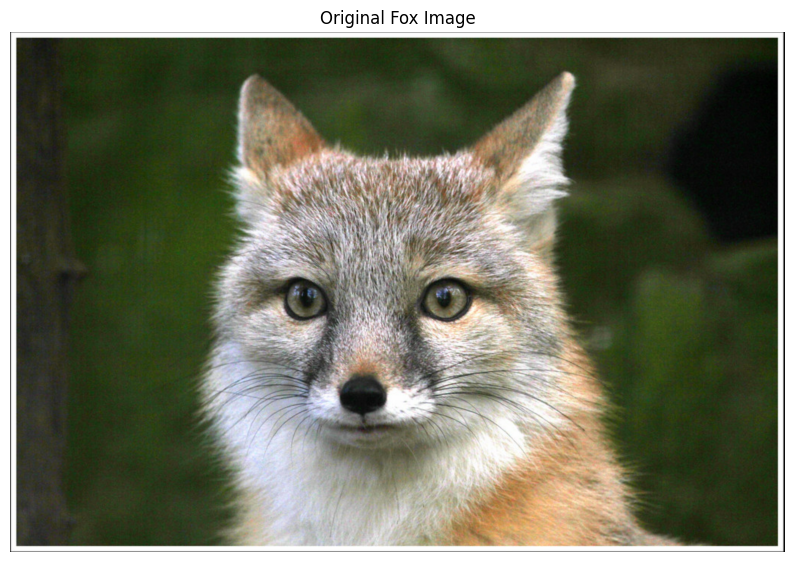

In [19]:
# Load the fox image
image_path = "../images/web/fox.png"
image = cv2.imread(image_path)

if image is None:
    raise FileNotFoundError(f"Could not load image: {image_path}")

# Convert BGR to RGB for display
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

print(f"Image loaded: {image_rgb.shape}")
print(f"Image dtype: {image_rgb.dtype}")
print(f"Image range: [{image_rgb.min()}, {image_rgb.max()}]")

# Display the original image
plt.figure(figsize=(10, 8))
plt.imshow(image_rgb)
plt.title("Original Fox Image")
plt.axis('off')
plt.show()


In [20]:
# Create dataloader and model
dataloader = PixelDataloader(image_rgb, batch_size=10000)

# Model configuration
pe_L = 10  # Positional encoding frequency
hidden_dim = 256  # Hidden layer width
num_layers = 4  # Number of hidden layers

model = NeuralField2D(pe_L=pe_L, hidden_dim=hidden_dim, num_layers=num_layers)

print(f"Model created:")
print(f"  Positional encoding L: {pe_L}")
print(f"  Hidden dimension: {hidden_dim}")
print(f"  Number of layers: {num_layers}")
print(f"  Total parameters: {sum(p.numel() for p in model.parameters()):,}")


Model created:
  Positional encoding L: 10
  Hidden dimension: 256
  Number of layers: 4
  Total parameters: 143,363


In [21]:
torch.cuda.is_available() 

False

In [22]:
# Training configuration
num_iterations = 2000
learning_rate = 1e-2
checkpoint_iterations = [0, 100, 500, 1000, 2000]  # Iterations to visualize

# Store checkpoints for visualization
checkpoints = {}
losses = []

# Setup device
device = torch.device('cuda' if torch.cuda.is_available() else 
                     'mps' if torch.backends.mps.is_available() else 'cpu')
print(f"Using device: {device}")

# Move model to device
model = model.to(device)
model.train()

# Setup optimizer and loss
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
criterion = nn.MSELoss()

print(f"\nTraining for {num_iterations} iterations...")
print(f"Will visualize at iterations: {checkpoint_iterations}")


Using device: cpu

Training for 2000 iterations...
Will visualize at iterations: [0, 100, 500, 1000, 2000]


In [23]:
# CUDA Diagnostic Cell
import torch
import sys

print("=" * 60)
print("CUDA DIAGNOSTICS")
print("=" * 60)

# Check PyTorch version
print(f"\nPyTorch version: {torch.__version__}")

# Check CUDA availability
print(f"CUDA available: {torch.cuda.is_available()}")

if torch.cuda.is_available():
    # Check CUDA version
    print(f"CUDA version: {torch.version.cuda}")
    
    # Check GPU info
    print(f"Number of GPUs: {torch.cuda.device_count()}")
    for i in range(torch.cuda.device_count()):
        print(f"\nGPU {i}:")
        print(f"  Name: {torch.cuda.get_device_name(i)}")
        print(f"  Compute Capability: {torch.cuda.get_device_capability(i)}")
        print(f"  Memory: {torch.cuda.get_device_properties(i).total_memory / 1e9:.2f} GB")
    
    # Try a simple CUDA operation
    print("\n" + "=" * 60)
    print("Testing CUDA operations...")
    try:
        test_tensor = torch.zeros(10).cuda()
        result = test_tensor + 1
        print("✓ Simple CUDA operation: SUCCESS")
        del test_tensor, result
        torch.cuda.empty_cache()
    except Exception as e:
        print(f"✗ Simple CUDA operation: FAILED")
        print(f"  Error: {e}")
        print("\nThis indicates a CUDA compatibility issue!")
        print("You may need to reinstall PyTorch with the correct CUDA version.")
else:
    print("CUDA is not available. Using CPU.")

print("\n" + "=" * 60)
print("RECOMMENDED FIX")
print("=" * 60)
print("If CUDA operations fail, reinstall PyTorch:")
print("1. Check your CUDA version: nvidia-smi")
print("2. Visit: https://pytorch.org/get-started/locally/")
print("3. Select your CUDA version and install the correct PyTorch")
print("   Example: pip install torch torchvision --index-url https://download.pytorch.org/whl/cu118")

CUDA DIAGNOSTICS

PyTorch version: 2.7.1+cu118
CUDA available: False
CUDA is not available. Using CPU.

RECOMMENDED FIX
If CUDA operations fail, reinstall PyTorch:
1. Check your CUDA version: nvidia-smi
2. Visit: https://pytorch.org/get-started/locally/
3. Select your CUDA version and install the correct PyTorch
   Example: pip install torch torchvision --index-url https://download.pytorch.org/whl/cu118


In [24]:
# Capture initial state (iteration 0)
if 0 in checkpoint_iterations:
    model.eval()
    with torch.no_grad():
        rendered = render_image(model, image_rgb.shape[:2], device=device)
    checkpoints[0] = rendered.copy()
    model.train()

# Training loop with checkpoints
for iteration in range(num_iterations):
    # Sample batch
    coords, colors_gt = dataloader.sample_batch()
    coords = coords.to(device)
    colors_gt = colors_gt.to(device)
    
    # Forward pass
    colors_pred = model(coords)
    
    # Compute loss
    loss = criterion(colors_pred, colors_gt)
    
    # Backward pass
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    losses.append(loss.item())
    
    # Save checkpoint if needed
    if (iteration + 1) in checkpoint_iterations:
        model.eval()
        with torch.no_grad():
            rendered = render_image(model, image_rgb.shape[:2], device=device)
        checkpoints[iteration + 1] = rendered.copy()
        model.train()
    
    # Print progress
    if (iteration + 1) % 100 == 0:
        psnr = compute_psnr(loss.item())
        print(f"Iteration {iteration+1}/{num_iterations}, Loss: {loss.item():.6f}, PSNR: {psnr:.2f} dB")

print("Training complete!")


Iteration 100/2000, Loss: 0.005273, PSNR: 22.78 dB
Iteration 200/2000, Loss: 0.003005, PSNR: 25.22 dB
Iteration 300/2000, Loss: 0.002627, PSNR: 25.80 dB
Iteration 400/2000, Loss: 0.002465, PSNR: 26.08 dB
Iteration 500/2000, Loss: 0.002318, PSNR: 26.35 dB
Iteration 600/2000, Loss: 0.002129, PSNR: 26.72 dB
Iteration 700/2000, Loss: 0.002034, PSNR: 26.92 dB
Iteration 800/2000, Loss: 0.001935, PSNR: 27.13 dB
Iteration 900/2000, Loss: 0.001891, PSNR: 27.23 dB
Iteration 1000/2000, Loss: 0.001764, PSNR: 27.54 dB
Iteration 1100/2000, Loss: 0.001786, PSNR: 27.48 dB
Iteration 1200/2000, Loss: 0.001776, PSNR: 27.51 dB
Iteration 1300/2000, Loss: 0.001795, PSNR: 27.46 dB
Iteration 1400/2000, Loss: 0.001775, PSNR: 27.51 dB
Iteration 1500/2000, Loss: 0.001620, PSNR: 27.90 dB
Iteration 1600/2000, Loss: 0.001655, PSNR: 27.81 dB
Iteration 1700/2000, Loss: 0.001623, PSNR: 27.90 dB
Iteration 1800/2000, Loss: 0.001588, PSNR: 27.99 dB
Iteration 1900/2000, Loss: 0.001554, PSNR: 28.08 dB
Iteration 2000/2000, 

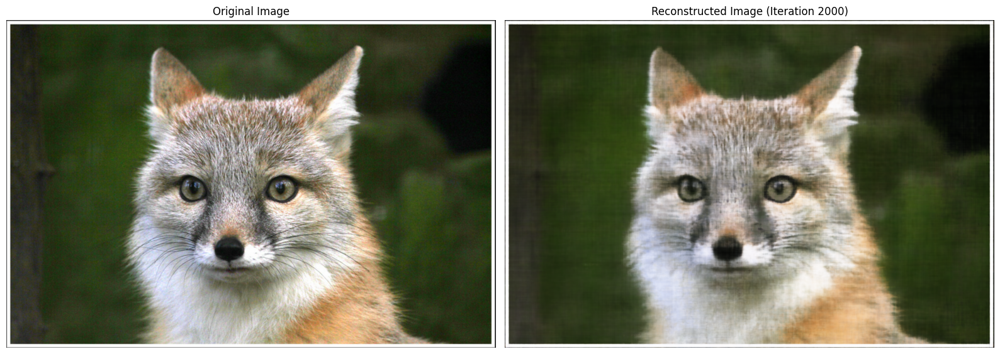


Final Loss: 0.001813
Final PSNR: 27.42 dB


In [25]:
# Render final image
model.eval()
final_rendered = render_image(model, image_rgb.shape[:2], device=device)

# Note: render_image already returns RGB (model was trained on RGB)
# No conversion needed - the rendered image is already in RGB format
final_rendered_rgb = final_rendered

# Display final result
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[0].imshow(image_rgb)
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(final_rendered_rgb)
axes[1].set_title(f"Reconstructed Image (Iteration {num_iterations})")
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Compute final metrics
final_loss = losses[-1]
final_psnr = compute_psnr(final_loss)
print(f"\nFinal Loss: {final_loss:.6f}")
print(f"Final PSNR: {final_psnr:.2f} dB")


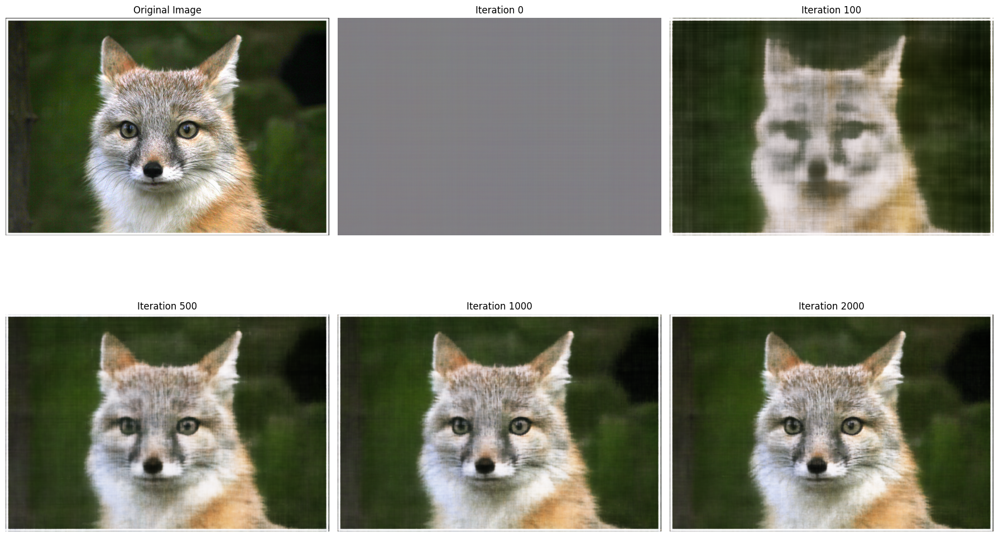

In [26]:
# Visualize training progression
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Add original image
axes[0].imshow(image_rgb)
axes[0].set_title("Original Image")
axes[0].axis('off')

# Display checkpoints
for idx, iter_num in enumerate(sorted(checkpoints.keys())):
    if idx + 1 < len(axes):
        rendered = checkpoints[iter_num]
        # No conversion needed - render_image already returns RGB
        axes[idx + 1].imshow(rendered)
        axes[idx + 1].set_title(f"Iteration {iter_num}")
        axes[idx + 1].axis('off')

# Hide unused subplots
for idx in range(len(checkpoints) + 1, len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()


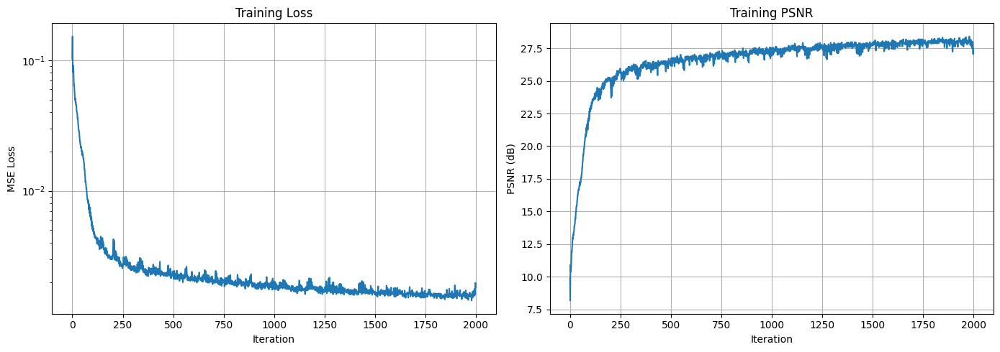

Initial PSNR: 9.90 dB
Final PSNR: 27.42 dB


In [27]:
# Plot training loss and PSNR curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Loss curve
axes[0].plot(losses)
axes[0].set_xlabel('Iteration')
axes[0].set_ylabel('MSE Loss')
axes[0].set_title('Training Loss')
axes[0].grid(True)
axes[0].set_yscale('log')

# PSNR curve
psnrs = [compute_psnr(loss) for loss in losses]
axes[1].plot(psnrs)
axes[1].set_xlabel('Iteration')
axes[1].set_ylabel('PSNR (dB)')
axes[1].set_title('Training PSNR')
axes[1].grid(True)

plt.tight_layout()
plt.show()

print(f"Initial PSNR: {psnrs[0]:.2f} dB")
print(f"Final PSNR: {psnrs[-1]:.2f} dB")


## Hyperparameter Sweep

Test different combinations of positional encoding frequency (pe_L) and hidden dimension (hidden_dim) to see how they affect the reconstruction quality.


In [28]:
# Hyperparameter sweep: 2x2 grid
# Test 2 values of pe_L and 2 values of hidden_dim

pe_L_values = [3, 10]  # Low and high positional encoding frequency
hidden_dim_values = [64, 256]  # Low and high hidden dimension

num_iterations_sweep = 1500  # Fewer iterations for faster sweep
learning_rate = 1e-2

results = {}  # Store results: (pe_L, hidden_dim) -> (rendered_image, final_loss, final_psnr)

print("Starting hyperparameter sweep...")
print(f"Testing {len(pe_L_values)} x {len(hidden_dim_values)} = {len(pe_L_values) * len(hidden_dim_values)} combinations")
print(f"Iterations per model: {num_iterations_sweep}\n")

for pe_L in pe_L_values:
    for hidden_dim in hidden_dim_values:
        print(f"=" * 60)
        print(f"Training: pe_L={pe_L}, hidden_dim={hidden_dim}")
        print(f"=" * 60)
        
        # Create new model
        model_sweep = NeuralField2D(pe_L=pe_L, hidden_dim=hidden_dim, num_layers=4)
        model_sweep = model_sweep.to(device)
        model_sweep.train()
        
        # Setup optimizer
        optimizer_sweep = torch.optim.Adam(model_sweep.parameters(), lr=learning_rate)
        criterion = nn.MSELoss()
        
        # Training loop
        losses_sweep = []
        for iteration in range(num_iterations_sweep):
            coords, colors_gt = dataloader.sample_batch()
            coords = coords.to(device)
            colors_gt = colors_gt.to(device)
            
            colors_pred = model_sweep(coords)
            loss = criterion(colors_pred, colors_gt)
            
            optimizer_sweep.zero_grad()
            loss.backward()
            optimizer_sweep.step()
            
            losses_sweep.append(loss.item())
            
            if (iteration + 1) % 500 == 0:
                psnr = compute_psnr(loss.item())
                print(f"  Iteration {iteration+1}/{num_iterations_sweep}, Loss: {loss.item():.6f}, PSNR: {psnr:.2f} dB")
        
        # Render final image
        model_sweep.eval()
        with torch.no_grad():
            rendered_sweep = render_image(model_sweep, image_rgb.shape[:2], device=device)
        
        final_loss = losses_sweep[-1]
        final_psnr = compute_psnr(final_loss)
        
        results[(pe_L, hidden_dim)] = (rendered_sweep, final_loss, final_psnr)
        print(f"  Final Loss: {final_loss:.6f}, Final PSNR: {final_psnr:.2f} dB\n")

print("Hyperparameter sweep complete!")


Starting hyperparameter sweep...
Testing 2 x 2 = 4 combinations
Iterations per model: 1500

Training: pe_L=3, hidden_dim=64


  Iteration 500/1500, Loss: 0.008501, PSNR: 20.71 dB
  Iteration 1000/1500, Loss: 0.004570, PSNR: 23.40 dB
  Iteration 1500/1500, Loss: 0.003784, PSNR: 24.22 dB
  Final Loss: 0.003784, Final PSNR: 24.22 dB

Training: pe_L=3, hidden_dim=256
  Iteration 500/1500, Loss: 0.004035, PSNR: 23.94 dB
  Iteration 1000/1500, Loss: 0.003285, PSNR: 24.84 dB
  Iteration 1500/1500, Loss: 0.003057, PSNR: 25.15 dB
  Final Loss: 0.003057, Final PSNR: 25.15 dB

Training: pe_L=10, hidden_dim=64
  Iteration 500/1500, Loss: 0.002949, PSNR: 25.30 dB
  Iteration 1000/1500, Loss: 0.002835, PSNR: 25.47 dB
  Iteration 1500/1500, Loss: 0.002365, PSNR: 26.26 dB
  Final Loss: 0.002365, Final PSNR: 26.26 dB

Training: pe_L=10, hidden_dim=256
  Iteration 500/1500, Loss: 0.002214, PSNR: 26.55 dB
  Iteration 1000/1500, Loss: 0.001771, PSNR: 27.52 dB
  Iteration 1500/1500, Loss: 0.001653, PSNR: 27.82 dB
  Final Loss: 0.001653, Final PSNR: 27.82 dB

Hyperparameter sweep complete!


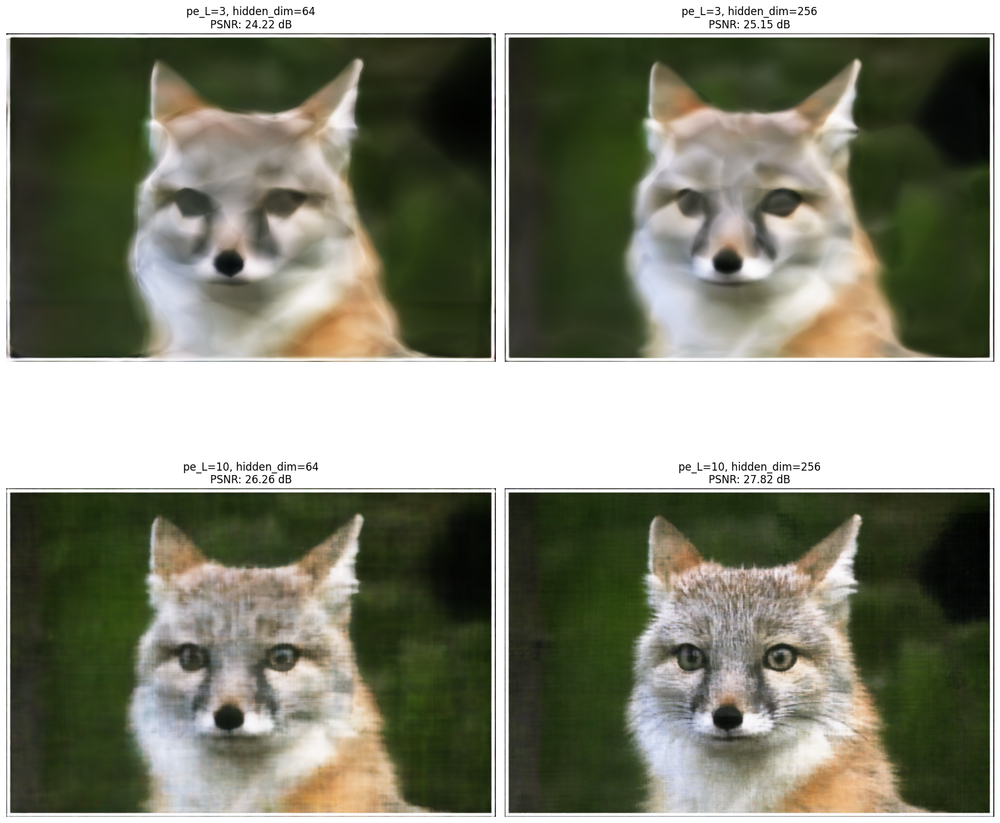


HYPERPARAMETER SWEEP RESULTS
pe_L     hidden_dim   Final Loss      Final PSNR  
------------------------------------------------------------
3        64           0.003784        24.22       
3        256          0.003057        25.15       
10       64           0.002365        26.26       
10       256          0.001653        27.82       


In [29]:
# Visualize 2x2 grid of results
fig, axes = plt.subplots(2, 2, figsize=(16, 16))

for idx_pe, pe_L in enumerate(pe_L_values):
    for idx_dim, hidden_dim in enumerate(hidden_dim_values):
        rendered, final_loss, final_psnr = results[(pe_L, hidden_dim)]
        
        ax = axes[idx_pe, idx_dim]
        ax.imshow(rendered)
        ax.set_title(f'pe_L={pe_L}, hidden_dim={hidden_dim}\nPSNR: {final_psnr:.2f} dB', 
                     fontsize=12)
        ax.axis('off')

plt.tight_layout()
plt.show()

# Print summary table
print("\n" + "="*60)
print("HYPERPARAMETER SWEEP RESULTS")
print("="*60)
print(f"{'pe_L':<8} {'hidden_dim':<12} {'Final Loss':<15} {'Final PSNR':<12}")
print("-"*60)
for pe_L in pe_L_values:
    for hidden_dim in hidden_dim_values:
        _, final_loss, final_psnr = results[(pe_L, hidden_dim)]
        print(f"{pe_L:<8} {hidden_dim:<12} {final_loss:<15.6f} {final_psnr:<12.2f}")


Train on Kirknite

In [30]:
# Load the IMG_6300.jpg image
image_path_2 = "../images/web/IMG_6300.jpg"
image_2 = cv2.imread(image_path_2)

if image_2 is None:
    raise FileNotFoundError(f"Could not load image: {image_path_2}")

# Convert BGR to RGB for display
image_rgb_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB)

print(f"Image loaded: {image_rgb_2.shape}")
print(f"Image dtype: {image_rgb_2.dtype}")
print(f"Image range: [{image_rgb_2.min()}, {image_rgb_2.max()}]")

# Display the original image
plt.figure(figsize=(10, 8))
plt.imshow(image_rgb_2)
plt.title("Original IMG_6300.jpg")
plt.axis('off')
plt.show()


[ WARN:0@590.056] global loadsave.cpp:275 findDecoder imread_('../images/web/IMG_6300.jpg'): can't open/read file: check file path/integrity


FileNotFoundError: Could not load image: ../images/web/IMG_6300.jpg

In [ ]:
# Create dataloader and model for second image
dataloader_2 = PixelDataloader(image_rgb_2, batch_size=10000)

# Model configuration (same as fox)
pe_L_2 = 10
hidden_dim_2 = 256
num_layers_2 = 4

model_2 = NeuralField2D(pe_L=pe_L_2, hidden_dim=hidden_dim_2, num_layers=num_layers_2)

print(f"Model created:")
print(f"  Positional encoding L: {pe_L_2}")
print(f"  Hidden dimension: {hidden_dim_2}")
print(f"  Number of layers: {num_layers_2}")
print(f"  Total parameters: {sum(p.numel() for p in model_2.parameters()):,}")


Model created:
  Positional encoding L: 10
  Hidden dimension: 256
  Number of layers: 4
  Total parameters: 143,363


In [ ]:
# Training configuration
num_iterations_2 = 2000
learning_rate_2 = 1e-2
checkpoint_iterations_2 = [0, 100, 500, 1000, 2000]

# Store checkpoints for visualization
checkpoints_2 = {}
losses_2 = []

# Move model to device
model_2 = model_2.to(device)
model_2.train()

# Setup optimizer and loss
optimizer_2 = torch.optim.Adam(model_2.parameters(), lr=learning_rate_2)
criterion_2 = nn.MSELoss()

print(f"Training for {num_iterations_2} iterations...")
print(f"Will visualize at iterations: {checkpoint_iterations_2}")


Training for 2000 iterations...
Will visualize at iterations: [0, 100, 500, 1000, 2000]


In [ ]:
# Capture initial state (iteration 0)
if 0 in checkpoint_iterations_2:
    model_2.eval()
    with torch.no_grad():
        rendered_2 = render_image(model_2, image_rgb_2.shape[:2], device=device)
    checkpoints_2[0] = rendered_2.copy()
    model_2.train()

# Training loop with checkpoints
for iteration in range(num_iterations_2):
    # Sample batch
    coords, colors_gt = dataloader_2.sample_batch()
    coords = coords.to(device)
    colors_gt = colors_gt.to(device)
    
    # Forward pass
    colors_pred = model_2(coords)
    
    # Compute loss
    loss = criterion_2(colors_pred, colors_gt)
    
    # Backward pass
    optimizer_2.zero_grad()
    loss.backward()
    optimizer_2.step()
    
    losses_2.append(loss.item())
    
    # Save checkpoint if needed
    if (iteration + 1) in checkpoint_iterations_2:
        model_2.eval()
        with torch.no_grad():
            rendered_2 = render_image(model_2, image_rgb_2.shape[:2], device=device)
        checkpoints_2[iteration + 1] = rendered_2.copy()
        model_2.train()
    
    # Print progress
    if (iteration + 1) % 100 == 0:
        psnr = compute_psnr(loss.item())
        print(f"Iteration {iteration+1}/{num_iterations_2}, Loss: {loss.item():.6f}, PSNR: {psnr:.2f} dB")

print("Training complete!")


Iteration 100/2000, Loss: 0.003237, PSNR: 24.90 dB
Iteration 200/2000, Loss: 0.002150, PSNR: 26.67 dB
Iteration 300/2000, Loss: 0.001710, PSNR: 27.67 dB
Iteration 400/2000, Loss: 0.001237, PSNR: 29.08 dB
Iteration 500/2000, Loss: 0.001024, PSNR: 29.90 dB
Iteration 600/2000, Loss: 0.000979, PSNR: 30.09 dB
Iteration 700/2000, Loss: 0.000810, PSNR: 30.91 dB
Iteration 800/2000, Loss: 0.000781, PSNR: 31.07 dB
Iteration 900/2000, Loss: 0.000797, PSNR: 30.99 dB
Iteration 1000/2000, Loss: 0.000675, PSNR: 31.71 dB
Iteration 1100/2000, Loss: 0.000622, PSNR: 32.06 dB
Iteration 1200/2000, Loss: 0.000539, PSNR: 32.68 dB
Iteration 1300/2000, Loss: 0.000550, PSNR: 32.60 dB
Iteration 1400/2000, Loss: 0.000586, PSNR: 32.32 dB
Iteration 1500/2000, Loss: 0.000642, PSNR: 31.93 dB
Iteration 1600/2000, Loss: 0.000619, PSNR: 32.08 dB
Iteration 1700/2000, Loss: 0.000515, PSNR: 32.88 dB
Iteration 1800/2000, Loss: 0.000488, PSNR: 33.11 dB
Iteration 1900/2000, Loss: 0.000441, PSNR: 33.56 dB
Iteration 2000/2000, 

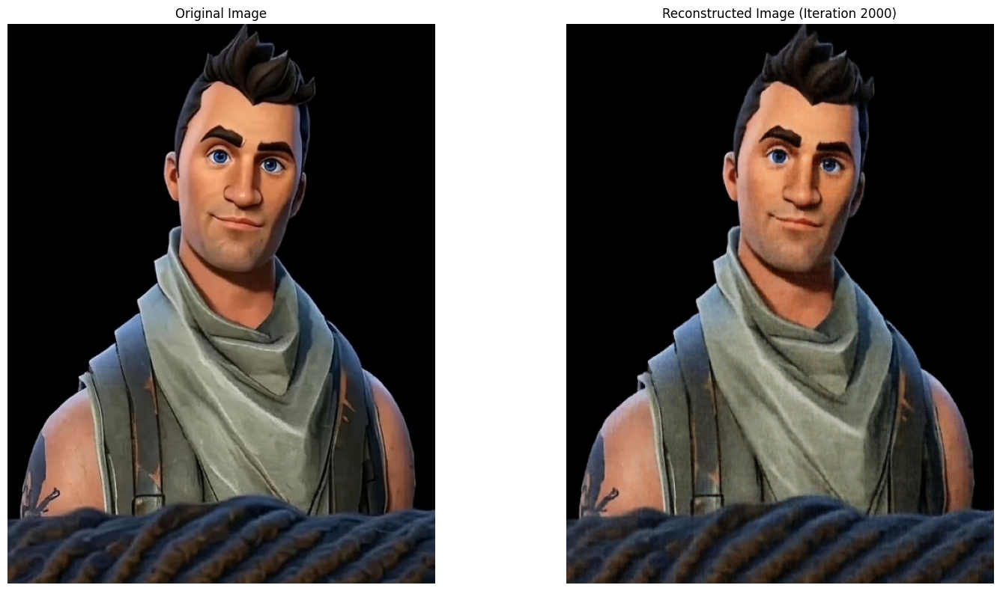


Final Loss: 0.000413
Final PSNR: 33.84 dB


In [ ]:
# Render final image
model_2.eval()
final_rendered_2 = render_image(model_2, image_rgb_2.shape[:2], device=device)

# Note: render_image already returns RGB (no conversion needed)
final_rendered_rgb_2 = final_rendered_2

# Display final result
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[0].imshow(image_rgb_2)
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(final_rendered_rgb_2)
axes[1].set_title(f"Reconstructed Image (Iteration {num_iterations_2})")
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Compute final metrics
final_loss_2 = losses_2[-1]
final_psnr_2 = compute_psnr(final_loss_2)
print(f"\nFinal Loss: {final_loss_2:.6f}")
print(f"Final PSNR: {final_psnr_2:.2f} dB")


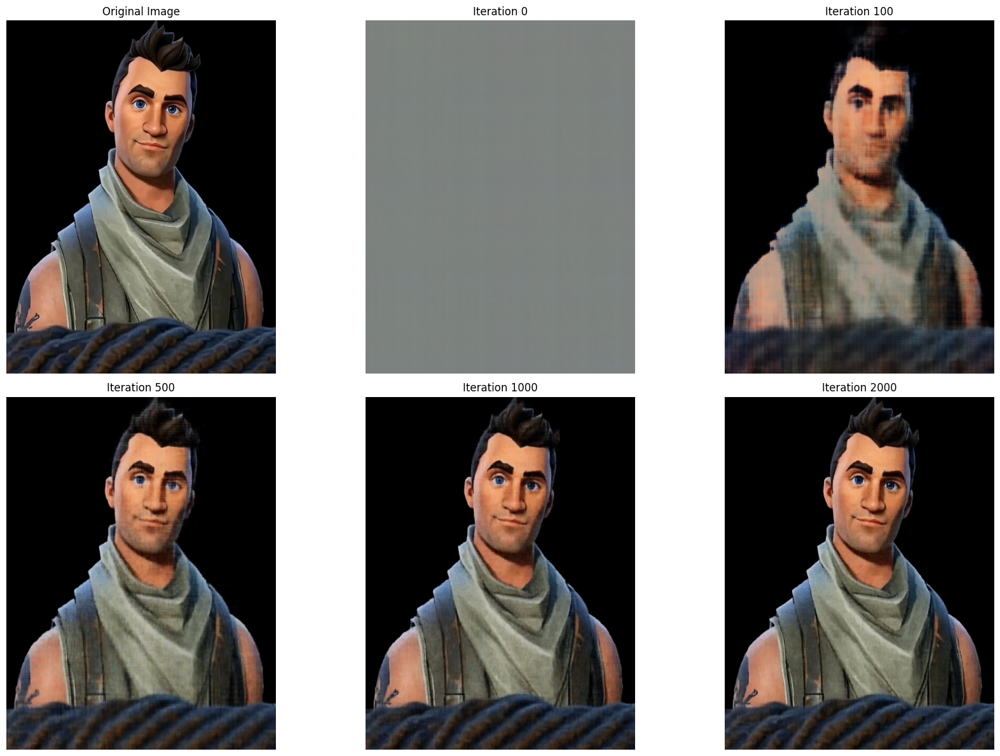

In [ ]:
# Visualize training progression
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Add original image
axes[0].imshow(image_rgb_2)
axes[0].set_title("Original Image")
axes[0].axis('off')

# Display checkpoints
# Note: rendered images are already RGB (no conversion needed)
for idx, iter_num in enumerate(sorted(checkpoints_2.keys())):
    if idx + 1 < len(axes):
        rendered = checkpoints_2[iter_num]
        # No conversion needed - render_image already returns RGB
        axes[idx + 1].imshow(rendered)
        axes[idx + 1].set_title(f"Iteration {iter_num}")
        axes[idx + 1].axis('off')

# Hide unused subplots
for idx in range(len(checkpoints_2) + 1, len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()


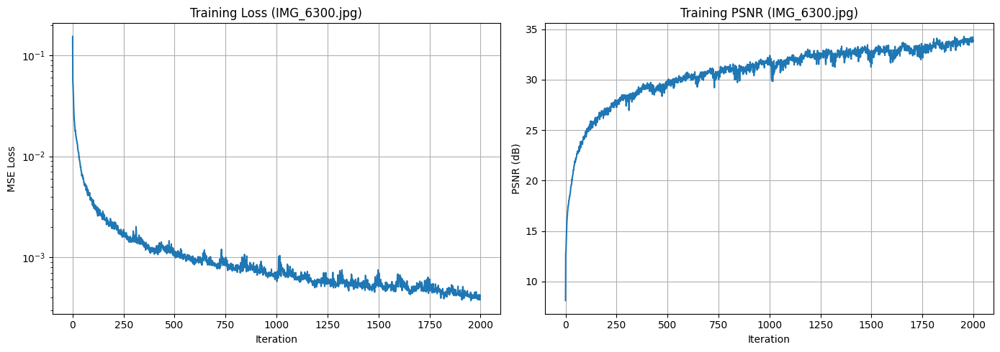

Initial PSNR: 8.12 dB
Final PSNR: 33.84 dB


In [ ]:
# Plot training loss and PSNR curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Loss curve
axes[0].plot(losses_2)
axes[0].set_xlabel('Iteration')
axes[0].set_ylabel('MSE Loss')
axes[0].set_title('Training Loss (IMG_6300.jpg)')
axes[0].grid(True)
axes[0].set_yscale('log')

# PSNR curve
psnrs_2 = [compute_psnr(loss) for loss in losses_2]
axes[1].plot(psnrs_2)
axes[1].set_xlabel('Iteration')
axes[1].set_ylabel('PSNR (dB)')
axes[1].set_title('Training PSNR (IMG_6300.jpg)')
axes[1].grid(True)

plt.tight_layout()
plt.show()

print(f"Initial PSNR: {psnrs_2[0]:.2f} dB")
print(f"Final PSNR: {psnrs_2[-1]:.2f} dB")


# Part 2: Fit a Neural Radiance Field from Multi-view Images

Now we'll work with 3D NeRF using the lego dataset with multiple camera views.


In [ ]:
# Load the lego dataset
data = np.load("../images/lego_200x200.npz")

# Training images: [100, 200, 200, 3]
images_train = data["images_train"] / 255.0

# Cameras for the training images (camera-to-world transformation matrix): [100, 4, 4]
c2ws_train = data["c2ws_train"]

# Validation images: [10, 200, 200, 3]
images_val = data["images_val"] / 255.0

# Cameras for the validation images: [10, 4, 4]
c2ws_val = data["c2ws_val"]

# Test cameras for novel-view video rendering: [60, 4, 4]
c2ws_test = data["c2ws_test"]

# Camera focal length
focal = data["focal"]  # float

print("Lego dataset loaded!")
print(f"Training images: {images_train.shape}")
print(f"Training cameras: {c2ws_train.shape}")
print(f"Validation images: {images_val.shape}")
print(f"Validation cameras: {c2ws_val.shape}")
print(f"Test cameras: {c2ws_test.shape}")
print(f"Focal length: {focal:.2f}")

# Construct camera intrinsic matrix K from focal length
# Assuming square pixels (fx = fy = focal) and principal point at image center
H, W = images_train.shape[1:3]
K = np.array([
    [focal, 0, W / 2.0],
    [0, focal, H / 2.0],
    [0, 0, 1]
], dtype=np.float32)

print(f"\nCamera intrinsic matrix K:")
print(K)


Lego dataset loaded!
Training images: (100, 200, 200, 3)
Training cameras: (100, 4, 4)
Validation images: (10, 200, 200, 3)
Validation cameras: (10, 4, 4)
Test cameras: (60, 4, 4)
Focal length: 277.78

Camera intrinsic matrix K:
[[277.77777   0.      100.     ]
 [  0.      277.77777 100.     ]
 [  0.        0.        1.     ]]


## Part 2.1: Create Rays from Cameras

# Import Part 2.1 functions from nerf.py


In [ ]:
from main import transform, pixel_to_camera, pixel_to_ray

print("✓ Imported Part 2.1 functions from main.py")

✓ Imported Part 2.1 functions from main.py


In [ ]:
# Test transform function
print("Testing transform function...")
test_c2w = np.eye(4)
test_c2w[:3, 3] = [1, 2, 3]  # Translation
test_point = np.array([0, 0, 1])  # Point at (0, 0, 1) in camera space

result = transform(test_c2w, test_point)
print(f"Input point (camera space): {test_point}")
print(f"Output point (world space): {result}")
print(f"Expected: [1, 2, 4] (translation + point)")
print(f"✓ Transform function works correctly!")


Testing transform function...
Input point (camera space): [0 0 1]
Output point (world space): [1. 2. 4.]
Expected: [1, 2, 4] (translation + point)
✓ Transform function works correctly!


In [ ]:
# Test pixel_to_camera function
print("Testing pixel_to_camera function...")
test_uv = np.array([100, 100])  # Pixel at (100, 100)
test_result = pixel_to_camera(K, test_uv, s=1.0)
print(f"Input pixel: {test_uv}")
print(f"Output camera point: {test_result}")
print(f"✓ pixel_to_camera function works correctly!")


Testing pixel_to_camera function...


NameError: name 'K' is not defined

In [ ]:
# Test pixel_to_ray function
print("Testing pixel_to_ray function...")
test_uv = np.array([W/2, H/2])  # Center pixel
test_ray_o, test_ray_d = pixel_to_ray(K, c2ws_train[0], test_uv)
print(f"Input pixel (center): {test_uv}")
print(f"Ray origin: {test_ray_o}")
print(f"Ray direction: {test_ray_d}")
print(f"Ray direction norm: {np.linalg.norm(test_ray_d):.6f} (should be ~1.0)")
print(f"✓ pixel_to_ray function works correctly!")


Testing pixel_to_ray function...
Input pixel (center): [100. 100.]
Ray origin: [-0.05379832  3.84547043  1.20808232]
Ray direction: [ 0.01334572 -0.95394381 -0.29968835]
Ray direction norm: 1.000000 (should be ~1.0)
✓ pixel_to_ray function works correctly!


## Part 2.2: Sampling - Testing

Test the sampling functions for rays and points along rays.


In [ ]:
# Import Part 2.2 functions
from main import sample_rays_from_images, sample_along_rays

print("✓ Imported Part 2.2 functions")


✓ Imported Part 2.2 functions


In [ ]:
# Test sample_rays_from_images
print("Testing sample_rays_from_images...")
print(f"Training images shape: {images_train.shape}")
print(f"Training cameras shape: {c2ws_train.shape}")

# Test with small number of rays
num_test_rays = 100
rays_o_test, rays_d_test, pixels_test, image_indices_test = sample_rays_from_images(
    images_train,
    c2ws_train,
    K,
    num_rays=num_test_rays,
    method='global'
)

print(f"\nSampled {num_test_rays} rays:")
print(f"  rays_o shape: {rays_o_test.shape}")
print(f"  rays_d shape: {rays_d_test.shape}")
print(f"  pixels shape: {pixels_test.shape}")
print(f"  image_indices shape: {image_indices_test.shape}")
print(f"  Unique images sampled: {len(np.unique(image_indices_test))}")

# Verify ray directions are normalized
ray_norms = np.linalg.norm(rays_d_test, axis=1)
print(f"\nRay direction norms: min={ray_norms.min():.6f}, max={ray_norms.max():.6f}, mean={ray_norms.mean():.6f}")
print(f"  (Should all be ~1.0)")

print("\n✓ sample_rays_from_images works correctly!")


Testing sample_rays_from_images...
Training images shape: (100, 200, 200, 3)
Training cameras shape: (100, 4, 4)



Sampled 100 rays:
  rays_o shape: (100, 3)
  rays_d shape: (100, 3)
  pixels shape: (100, 3)
  image_indices shape: (100,)
  Unique images sampled: 63

Ray direction norms: min=1.000000, max=1.000000, mean=1.000000
  (Should all be ~1.0)

✓ sample_rays_from_images works correctly!


In [ ]:
# Test sample_along_rays
print("Testing sample_along_rays...")

# Use the rays from previous test
n_samples = 32
points_test, t_vals_test = sample_along_rays(
    rays_o_test,
    rays_d_test,
    near=2.0,
    far=6.0,
    n_samples=n_samples,
    perturb=True
)

print(f"Sampled points along {num_test_rays} rays:")
print(f"  points shape: {points_test.shape} (should be ({num_test_rays}, {n_samples}, 3))")
print(f"  t_vals shape: {t_vals_test.shape} (should be ({num_test_rays}, {n_samples}))")

# Verify t values are in correct range
print(f"\nt_vals range: min={t_vals_test.min():.3f}, max={t_vals_test.max():.3f}")
print(f"  (Should be between 2.0 and 6.0, with some perturbation)")

# Verify points are on the rays
# For each ray, check that points = ray_o + t * ray_d
for i in range(min(3, num_test_rays)):
    expected_points = rays_o_test[i:i+1, None, :] + rays_d_test[i:i+1, None, :] * t_vals_test[i:i+1, :, None]
    actual_points = points_test[i:i+1, :, :]
    diff = np.abs(expected_points - actual_points).max()
    print(f"  Ray {i}: max difference = {diff:.6f} (should be ~0)")

print("\n✓ sample_along_rays works correctly!")


Testing sample_along_rays...
Sampled points along 100 rays:
  points shape: (100, 32, 3) (should be (100, 32, 3))
  t_vals shape: (100, 32) (should be (100, 32))

t_vals range: min=2.001, max=6.125
  (Should be between 2.0 and 6.0, with some perturbation)
  Ray 0: max difference = 0.000000 (should be ~0)
  Ray 1: max difference = 0.000000 (should be ~0)
  Ray 2: max difference = 0.000000 (should be ~0)

✓ sample_along_rays works correctly!


## Part 2: Deliverable - Visualization of Rays and Samples

Visualize cameras, rays, and sample points for the deliverables.


In [ ]:
# Part 2 Deliverable: Visualize cameras, rays, and sample points
# This creates a 3D visualization showing up to 100 rays and their sample points

# Set to False to skip interactive visualization (for "Run All")
RUN_INTERACTIVE_VIZ = False

import viser
import time
import numpy as np
from main import sample_along_rays

# Sample rays from the dataset (up to 100 as per requirements)
num_rays_vis = 100
print(f"Sampling {num_rays_vis} rays for visualization...")

rays_o_vis, rays_d_vis, pixels_vis = dataset.sample_rays(num_rays_vis)

# Sample points along rays
points_vis, t_vals_vis = sample_along_rays(
    rays_o_vis, rays_d_vis,
    near=2.0, far=6.0,
    n_samples=32,
    perturb=True
)

print(f"Sampled {len(points_vis)} points along {num_rays_vis} rays")
print(f"Points shape: {points_vis.shape}")

# Create Viser server
server_rays = viser.ViserServer(share=True, port=8082)

# Add camera frustums for all training cameras
H, W = images_train.shape[1:3]
for i, (image, c2w) in enumerate(zip(images_train, c2ws_train)):
    server_rays.scene.add_camera_frustum(
        f"/cameras/{i}",
        fov=2 * np.arctan2(H / 2, K[0, 0]),
        aspect=W / H,
        scale=0.15,
        wxyz=viser.transforms.SO3.from_matrix(c2w[:3, :3]).wxyz,
        position=c2w[:3, 3],
        image=image
    )

# Add rays as splines
for i, (o, d) in enumerate(zip(rays_o_vis, rays_d_vis)):
    # Create ray line from origin to far point
    positions = np.stack((o, o + d * 6.0))
    server_rays.scene.add_spline_catmull_rom(
        f"/rays/{i}",
        positions=positions,
    )

# Add sample points as point cloud
server_rays.scene.add_point_cloud(
    f"/samples",
    colors=np.zeros_like(points_vis).reshape(-1, 3),
    points=points_vis.reshape(-1, 3),
    point_size=0.02,
)

print("\n✓ Visualization created with:")
print(f"  - {len(images_train)} camera frustums")
print(f"  - {num_rays_vis} rays (splines)")
print(f"  - {points_vis.size // 3} sample points")
print("\nOpen the URL shown above in your browser to view")
print("Take a screenshot for Part 2 Deliverable")

if RUN_INTERACTIVE_VIZ:
    print("\nPress Ctrl+C to stop the server when done...")
    # Keep server running
    try:
        while True:
            time.sleep(0.1)
    except KeyboardInterrupt:
        print("\nServer stopped.")
else:
    print("\n(Interactive visualization skipped - set RUN_INTERACTIVE_VIZ=True to enable)")
    print("Server URL available above - you can open it manually in your browser")


Sampling 100 rays for visualization...


NameError: name 'dataset' is not defined

## Part 2.3: Dataloader - Testing

Test the RaysData dataloader that combines ray sampling.


In [31]:
# Import Part 2.3 dataloader
from main import RaysData

print("✓ Imported RaysData class")


✓ Imported RaysData class


In [32]:
# Test RaysData dataloader
print("Creating RaysData dataloader...")
print("This may take a moment as it pre-computes all rays...")

dataset = RaysData(images_train, c2ws_train, K)

print(f"\nDataset created!")
print(f"  Total pixels: {len(dataset.pixels)}")
print(f"  Total rays: {len(dataset.rays_o)}")
print(f"  UV coordinates shape: {dataset.uvs.shape}")

# Test sampling
num_sample_rays = 1000
rays_o_sample, rays_d_sample, pixels_sample = dataset.sample_rays(num_sample_rays)

print(f"\nSampled {num_sample_rays} rays:")
print(f"  rays_o shape: {rays_o_sample.shape}")
print(f"  rays_d shape: {rays_d_sample.shape}")
print(f"  pixels shape: {pixels_sample.shape}")

# Verify ray directions are normalized
ray_norms = np.linalg.norm(rays_d_sample, axis=1)
print(f"\nRay direction norms: min={ray_norms.min():.6f}, max={ray_norms.max():.6f}")
print(f"  (Should all be ~1.0)")

# Verify pixels are in [0, 1] range
print(f"\nPixel values range: [{pixels_sample.min():.3f}, {pixels_sample.max():.3f}]")
print(f"  (Should be in [0, 1])")

print("\n✓ RaysData dataloader works correctly!")


Creating RaysData dataloader...
This may take a moment as it pre-computes all rays...


NameError: name 'images_train' is not defined

In [ ]:
# Verify UV indexing matches pixels (as mentioned in project description)
print("Verifying UV to pixel mapping...")

# Test with a subset
uvs_start = 0
uvs_end = 40_000
sample_uvs = dataset.uvs[uvs_start:uvs_end]

# Check that pixels match
# uvs are xy coordinates, so we need to index into the 0th image tensor with [0, height, width]
# So we need to index with uv[:,1] and then uv[:,0]
pixels_from_uvs = images_train[0, sample_uvs[:, 1].astype(int), sample_uvs[:, 0].astype(int)]
pixels_from_dataset = dataset.pixels[uvs_start:uvs_end]

# Compare (allowing for small floating point differences)
diff = np.abs(pixels_from_uvs - pixels_from_dataset).max()
print(f"Max difference between UV-indexed pixels and dataset pixels: {diff:.6f}")
print(f"  (Should be very small, < 0.01)")

if diff < 0.01:
    print("✓ UV to pixel mapping is correct!")
else:
    print("⚠ Warning: UV to pixel mapping may have issues")


Verifying UV to pixel mapping...
Max difference between UV-indexed pixels and dataset pixels: 0.000000
  (Should be very small, < 0.01)
✓ UV to pixel mapping is correct!


## Part 2.4: Neural Radiance Field - Testing

Test the NeRF model architecture.


In [ ]:
# Import Part 2.4 NeRF model
from main import NeRF, positional_encoding_3d, positional_encoding_viewdir

print("✓ Imported NeRF model and positional encoding functions")


✓ Imported NeRF model and positional encoding functions


In [ ]:
# Test positional encoding functions
print("Testing positional encoding functions...")

# Test 3D coordinate encoding
test_coords = torch.randn(10, 3)
encoded_coords = positional_encoding_3d(test_coords, L=10)
print(f"3D coordinate encoding:")
print(f"  Input shape: {test_coords.shape}")
print(f"  Output shape: {encoded_coords.shape}")
print(f"  Expected: (10, 63) for L=10 [3 * (2*10 + 1) = 63]")

# Test view direction encoding
test_viewdirs = torch.randn(10, 3)
encoded_viewdirs = positional_encoding_viewdir(test_viewdirs, L=4)
print(f"\nView direction encoding:")
print(f"  Input shape: {test_viewdirs.shape}")
print(f"  Output shape: {encoded_viewdirs.shape}")
print(f"  Expected: (10, 27) for L=4 [3 * (2*4 + 1) = 27]")

print("\n✓ Positional encoding functions work correctly!")


Testing positional encoding functions...
3D coordinate encoding:
  Input shape: torch.Size([10, 3])
  Output shape: torch.Size([10, 63])
  Expected: (10, 63) for L=10 [3 * (2*10 + 1) = 63]

View direction encoding:
  Input shape: torch.Size([10, 3])
  Output shape: torch.Size([10, 27])
  Expected: (10, 27) for L=4 [3 * (2*4 + 1) = 27]

✓ Positional encoding functions work correctly!


In [ ]:
# Create and test NeRF model
print("Creating NeRF model...")

model_nerf = NeRF(
    pe_L_coords=10,
    pe_L_viewdir=4,
    hidden_dim=256,
    num_layers=8
)

print(f"Model created!")
print(f"  Total parameters: {sum(p.numel() for p in model_nerf.parameters()):,}")

# Test forward pass with single points
print("\nTesting forward pass with single points...")
test_coords = torch.randn(100, 3)
test_viewdirs = torch.randn(100, 3)

densities, colors = model_nerf(test_coords, test_viewdirs)

print(f"  Input coords shape: {test_coords.shape}")
print(f"  Input viewdirs shape: {test_viewdirs.shape}")
print(f"  Output densities shape: {densities.shape}")
print(f"  Output colors shape: {colors.shape}")

# Verify output ranges
print(f"\nOutput ranges:")
print(f"  Densities: min={densities.min().item():.4f}, max={densities.max().item():.4f}")
print(f"    (Should be >= 0 due to ReLU)")
print(f"  Colors: min={colors.min().item():.4f}, max={colors.max().item():.4f}")
print(f"    (Should be in [0, 1] due to Sigmoid)")

print("\n✓ NeRF model forward pass works correctly!")


Creating NeRF model...
Model created!
  Total parameters: 530,052

Testing forward pass with single points...
  Input coords shape: torch.Size([100, 3])
  Input viewdirs shape: torch.Size([100, 3])
  Output densities shape: torch.Size([100, 1])
  Output colors shape: torch.Size([100, 3])

Output ranges:
  Densities: min=0.0099, max=0.0245
    (Should be >= 0 due to ReLU)
  Colors: min=0.4431, max=0.5215
    (Should be in [0, 1] due to Sigmoid)

✓ NeRF model forward pass works correctly!


In [ ]:
# Test forward pass with batched samples (for volume rendering)
print("Testing forward pass with batched samples...")

# Simulate volume rendering input: (N_rays, n_samples, 3)
N_rays = 10
n_samples = 32
test_coords_batch = torch.randn(N_rays, n_samples, 3)
test_viewdirs_batch = torch.randn(N_rays, n_samples, 3)

densities_batch, colors_batch = model_nerf(test_coords_batch, test_viewdirs_batch)

print(f"  Input coords shape: {test_coords_batch.shape}")
print(f"  Input viewdirs shape: {test_viewdirs_batch.shape}")
print(f"  Output densities shape: {densities_batch.shape}")
print(f"  Output colors shape: {colors_batch.shape}")
print(f"  Expected: densities ({N_rays}, {n_samples}, 1), colors ({N_rays}, {n_samples}, 3)")

# Verify output ranges
print(f"\nOutput ranges:")
print(f"  Densities: min={densities_batch.min().item():.4f}, max={densities_batch.max().item():.4f}")
print(f"  Colors: min={colors_batch.min().item():.4f}, max={colors_batch.max().item():.4f}")

print("\n✓ NeRF model handles batched samples correctly!")


Testing forward pass with batched samples...
  Input coords shape: torch.Size([10, 32, 3])
  Input viewdirs shape: torch.Size([10, 32, 3])
  Output densities shape: torch.Size([10, 32, 1])
  Output colors shape: torch.Size([10, 32, 3])
  Expected: densities (10, 32, 1), colors (10, 32, 3)

Output ranges:
  Densities: min=0.0091, max=0.0263
  Colors: min=0.4416, max=0.5272

✓ NeRF model handles batched samples correctly!


In [ ]:
# Integration test: Complete pipeline
print("Integration test: Sampling → NeRF prediction")
print("=" * 60)

# Step 1: Sample rays from images
num_rays = 10
rays_o_int, rays_d_int, pixels_int = dataset.sample_rays(num_rays)
print(f"Step 1: Sampled {num_rays} rays")
print(f"  rays_o: {rays_o_int.shape}, rays_d: {rays_d_int.shape}")

# Step 2: Sample points along rays
points_int, t_vals_int = sample_along_rays(
    rays_o_int,
    rays_d_int,
    near=2.0,
    far=6.0,
    n_samples=32,
    perturb=True
)
print(f"\nStep 2: Sampled points along rays")
print(f"  points: {points_int.shape}, t_vals: {t_vals_int.shape}")

# Step 3: Predict with NeRF
# Convert to tensors
points_tensor = torch.from_numpy(points_int).float()  # (N_rays, n_samples, 3)
# Expand view directions to match points (same direction for all samples on a ray)
viewdirs_tensor = torch.from_numpy(rays_d_int).float()  # (N_rays, 3)
viewdirs_tensor = viewdirs_tensor[:, None, :].expand(-1, 32, -1)  # (N_rays, n_samples, 3)

# Move to device if available
device = torch.device('cuda' if torch.cuda.is_available() else 
                     'mps' if torch.backends.mps.is_available() else 'cpu')
model_nerf = model_nerf.to(device)
points_tensor = points_tensor.to(device)
viewdirs_tensor = viewdirs_tensor.to(device)

model_nerf.eval()
with torch.no_grad():
    densities_int, colors_int = model_nerf(points_tensor, viewdirs_tensor)

print(f"\nStep 3: NeRF predictions")
print(f"  densities: {densities_int.shape}")
print(f"  colors: {colors_int.shape}")

# Verify shapes
print(f"\nShape verification:")
print(f"  Points: {points_int.shape} → Densities: {densities_int.shape} ✓")
print(f"  Points: {points_int.shape} → Colors: {colors_int.shape} ✓")

print("\n✓ Complete pipeline works correctly!")
print("Ready for volume rendering (Part 2.5)!")


Integration test: Sampling → NeRF prediction
Step 1: Sampled 10 rays
  rays_o: (10, 3), rays_d: (10, 3)

Step 2: Sampled points along rays
  points: (10, 32, 3), t_vals: (10, 32)

Step 3: NeRF predictions
  densities: torch.Size([10, 32, 1])
  colors: torch.Size([10, 32, 3])

Shape verification:
  Points: (10, 32, 3) → Densities: torch.Size([10, 32, 1]) ✓
  Points: (10, 32, 3) → Colors: torch.Size([10, 32, 3]) ✓

✓ Complete pipeline works correctly!
Ready for volume rendering (Part 2.5)!


## Part 2.5-2.6: Training NeRF on Lego Dataset

Train the NeRF model on the entire lego dataset.


In [ ]:
import torch
from main import clear_gpu_memory

# Clear all GPU memory
clear_gpu_memory()

# Select GPU 1
torch.cuda.set_device(1)
device = torch.device('cuda:1')
print(f"Switched to {device}")

RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx

In [ ]:
# Import training functions
from main import volume_render, volume_render_torch, sample_along_rays, pixel_to_ray
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

print("✓ Imported training functions")


✓ Imported training functions


## Part 2: Deliverable - Training Progression Visualization

Render images at different training iterations to show training progression.


Rendering training progression...

Rendering validation image 0...
  PSNR: 22.38 dB

Rendering validation image 1...
  PSNR: 21.42 dB

Rendering validation image 2...
  PSNR: 21.86 dB


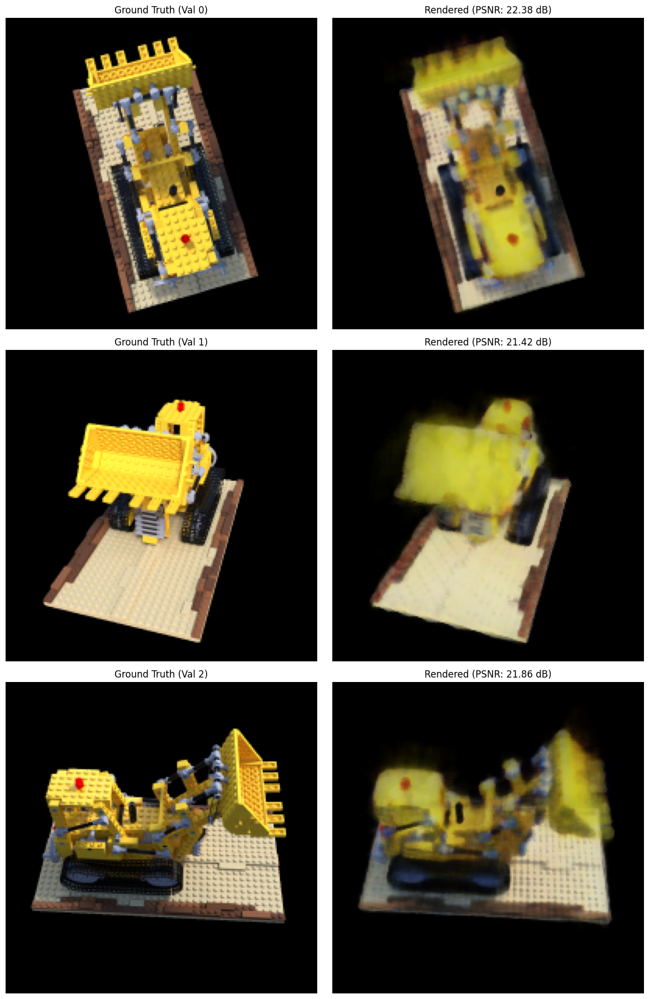


✓ Training progression visualization saved to 'part2_training_progression.png'


In [ ]:
# Part 2 Deliverable: Training progression visualization
# Render validation images at different training iterations

# Load model checkpoints if available, or use current model
# For this example, we'll render with the current trained model
# In practice, you'd load checkpoints from different iterations

# Define rendering parameters (same as training configuration)
n_samples = 64  # Number of samples per ray
near = 2.0
far = 6.0

print("Rendering training progression...")
print("=" * 70)

# Render validation images at current state
model_nerf.eval()

# Select a few validation images to render
val_indices_to_render = [0, 1, 2]  # Render first 3 validation images
rendered_val_images = []

for val_idx in val_indices_to_render:
    print(f"\nRendering validation image {val_idx}...")
    val_image = images_val[val_idx]
    val_c2w = c2ws_val[val_idx]
    H_val, W_val = val_image.shape[:2]
    
    # Generate all rays (vectorized)
    y_coords, x_coords = np.meshgrid(
        np.arange(H_val), 
        np.arange(W_val), 
        indexing='ij'
    )
    all_uvs = np.stack([x_coords.flatten() + 0.5, y_coords.flatten() + 0.5], axis=1)
    val_rays_o, val_rays_d = pixel_to_ray(K, val_c2w, all_uvs)
    
    # Render in batches
    batch_size_render = 1024
    rendered_pixels = []
    
    with torch.no_grad():
        for i in range(0, len(val_rays_o), batch_size_render):
            batch_rays_o = val_rays_o[i:i+batch_size_render]
            batch_rays_d = val_rays_d[i:i+batch_size_render]
            
            batch_points, batch_t_vals = sample_along_rays(
                batch_rays_o, batch_rays_d,
                near=near, far=far,
                n_samples=n_samples,
                perturb=False
            )
            
            batch_points_tensor = torch.from_numpy(batch_points).float().to(device)
            batch_viewdirs_tensor = torch.from_numpy(batch_rays_d).float().to(device)
            batch_viewdirs_tensor = batch_viewdirs_tensor[:, None, :].expand(-1, n_samples, -1)
            
            batch_densities, batch_colors = model_nerf(batch_points_tensor, batch_viewdirs_tensor)
            
            batch_densities_np = batch_densities.cpu().numpy()
            batch_colors_np = batch_colors.cpu().numpy()
            batch_rendered, _ = volume_render(batch_densities_np, batch_colors_np, batch_t_vals, batch_rays_d)
            
            rendered_pixels.append(batch_rendered)
    
    rendered_pixels = np.concatenate(rendered_pixels, axis=0)
    rendered_image = rendered_pixels.reshape(H_val, W_val, 3)
    
    # Compute metrics
    val_mse = np.mean((rendered_image - val_image) ** 2)
    val_psnr = -10 * np.log10(val_mse) if val_mse > 0 else float('inf')
    
    rendered_val_images.append({
        'gt': val_image,
        'rendered': rendered_image,
        'psnr': val_psnr,
        'idx': val_idx
    })
    
    print(f"  PSNR: {val_psnr:.2f} dB")

# Visualize training progression
fig, axes = plt.subplots(len(val_indices_to_render), 2, figsize=(12, 6 * len(val_indices_to_render)))

for i, result in enumerate(rendered_val_images):
    axes[i, 0].imshow(result['gt'])
    axes[i, 0].set_title(f'Ground Truth (Val {result["idx"]})')
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(result['rendered'])
    axes[i, 1].set_title(f'Rendered (PSNR: {result["psnr"]:.2f} dB)')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.savefig('part2_training_progression.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✓ Training progression visualization saved to 'part2_training_progression.png'")


## Part 2: Deliverable - Spherical Rendering Video

Render a video of the Lego scene from test camera poses (spherical path).


In [ ]:
# Part 2 Deliverable: Spherical rendering video
# Render novel views from test camera poses

# Define rendering parameters (same as training configuration)
n_samples = 64  # Number of samples per ray
near = 2.0
far = 6.0

print("Rendering spherical video from test cameras...")
print("=" * 70)

model_nerf.eval()

# Use test cameras for novel view rendering
test_c2ws = c2ws_test
num_test_cameras = len(test_c2ws)
H_test, W_test = images_train.shape[1:3]  # Use same resolution as training

print(f"Rendering {num_test_cameras} frames at {H_test}x{W_test} resolution...")

frames = []

for frame_idx, test_c2w in enumerate(test_c2ws):
    if (frame_idx + 1) % 10 == 0:
        print(f"  Rendering frame {frame_idx + 1}/{num_test_cameras}...")
    
    # Generate all rays for this camera
    y_coords, x_coords = np.meshgrid(
        np.arange(H_test), 
        np.arange(W_test), 
        indexing='ij'
    )
    all_uvs = np.stack([x_coords.flatten() + 0.5, y_coords.flatten() + 0.5], axis=1)
    test_rays_o, test_rays_d = pixel_to_ray(K, test_c2w, all_uvs)
    
    # Render in batches
    batch_size_render = 1024
    rendered_pixels = []
    
    with torch.no_grad():
        for i in range(0, len(test_rays_o), batch_size_render):
            batch_rays_o = test_rays_o[i:i+batch_size_render]
            batch_rays_d = test_rays_d[i:i+batch_size_render]
            
            batch_points, batch_t_vals = sample_along_rays(
                batch_rays_o, batch_rays_d,
                near=near, far=far,
                n_samples=n_samples,
                perturb=False
            )
            
            batch_points_tensor = torch.from_numpy(batch_points).float().to(device)
            batch_viewdirs_tensor = torch.from_numpy(batch_rays_d).float().to(device)
            batch_viewdirs_tensor = batch_viewdirs_tensor[:, None, :].expand(-1, n_samples, -1)
            
            batch_densities, batch_colors = model_nerf(batch_points_tensor, batch_viewdirs_tensor)
            
            batch_densities_np = batch_densities.cpu().numpy()
            batch_colors_np = batch_colors.cpu().numpy()
            batch_rendered, _ = volume_render(batch_densities_np, batch_colors_np, batch_t_vals, batch_rays_d)
            
            rendered_pixels.append(batch_rendered)
    
    rendered_pixels = np.concatenate(rendered_pixels, axis=0)
    rendered_frame = rendered_pixels.reshape(H_test, W_test, 3)
    
    # Clip to [0, 1] and convert to uint8
    rendered_frame = np.clip(rendered_frame, 0, 1)
    rendered_frame_uint8 = (rendered_frame * 255).astype(np.uint8)
    
    frames.append(rendered_frame_uint8)

# Convert frames to numpy array
frames_array = np.array(frames)
print(f"\n✓ Rendered {len(frames)} frames")

# Save as GIF using imageio
try:
    import imageio
    gif_path = 'lego_spherical_rendering.gif'
    print(f"\nSaving GIF to {gif_path}...")
    imageio.mimsave(gif_path, frames_array, duration=0.1, loop=0)
    print(f"✓ GIF saved: {gif_path}")
except ImportError:
    print("\n⚠ imageio not available. Install with: pip install imageio")
    print("Frames are stored in 'frames' variable. You can save them manually.")

# Also save first few frames as images for preview
print("\nSaving preview frames...")
for i in [0, len(frames)//4, len(frames)//2, 3*len(frames)//4, len(frames)-1]:
    if i < len(frames):
        import matplotlib.pyplot as plt
        plt.figure(figsize=(8, 8))
        plt.imshow(frames[i])
        plt.axis('off')
        plt.title(f'Frame {i+1}/{len(frames)}')
        plt.savefig(f'lego_frame_{i+1}.png', dpi=150, bbox_inches='tight')
        plt.close()

print("✓ Preview frames saved")


Rendering spherical video from test cameras...
Rendering 60 frames at 200x200 resolution...
  Rendering frame 10/60...
  Rendering frame 20/60...
  Rendering frame 30/60...
  Rendering frame 40/60...
  Rendering frame 50/60...
  Rendering frame 60/60...

✓ Rendered 60 frames

Saving GIF to lego_spherical_rendering.gif...
✓ GIF saved: lego_spherical_rendering.gif

Saving preview frames...
✓ Preview frames saved


In [ ]:
# Training configuration
print("Setting up training...")
print("=" * 70)

# Hyperparameters
num_iterations = 10000
batch_size = 4096  # Number of rays per batch
learning_rate = 5e-4
n_samples = 64  # Number of samples per ray
near = 2.0
far = 6.0

# Device
device = torch.device('cuda' if torch.cuda.is_available() else 
                     'mps' if torch.backends.mps.is_available() else 'cpu')
print(f"Using device: {device}")

# Initialize model
model_nerf = NeRF(
    pe_L_coords=10,
    pe_L_viewdir=4,
    hidden_dim=256,
    num_layers=8
).to(device)

# Optimizer (not needed for inference, but kept for compatibility)
optimizer = optim.Adam(model_nerf.parameters(), lr=learning_rate)

# Loss function (not needed for inference, but kept for compatibility)
criterion = nn.MSELoss()

print(f"\nModel configuration:")
print(f"  Samples per ray: {n_samples}")
print(f"  Near/Far: {near}/{far}")
print(f"  Model parameters: {sum(p.numel() for p in model_nerf.parameters()):,}")

# Training history (empty for now, will be loaded from checkpoint if available)
train_losses = []
train_psnrs = []


Setting up training...
Using device: cpu

Model configuration:
  Samples per ray: 64
  Near/Far: 2.0/6.0
  Model parameters: 530,052


In [ ]:
# ============================================================================
# TRAINING CODE COMMENTED OUT - Loading model from checkpoint instead
# ============================================================================
# # Training loop
# print("\nStarting training...")
# print("=" * 70)
# 
# model_nerf.train()
# 
# for iteration in range(num_iterations):
#     # Sample rays from training images
#     rays_o, rays_d, pixels_gt = dataset.sample_rays(batch_size)
#     
#     # Sample points along rays
#     points, t_vals = sample_along_rays(
#         rays_o, rays_d, 
#         near=near, far=far, 
#         n_samples=n_samples, 
#         perturb=True
#     )
#     
#     # Convert to tensors
#     points_tensor = torch.from_numpy(points).float().to(device)  # (batch_size, n_samples, 3)
#     viewdirs_tensor = torch.from_numpy(rays_d).float().to(device)  # (batch_size, 3)
#     viewdirs_tensor = viewdirs_tensor[:, None, :].expand(-1, n_samples, -1)  # (batch_size, n_samples, 3)
#     pixels_gt_tensor = torch.from_numpy(pixels_gt).float().to(device)  # (batch_size, 3)
#     
#     # Forward pass
#     densities, colors = model_nerf(points_tensor, viewdirs_tensor)
#     
#     # Volume rendering (PyTorch version for gradients)
#     t_vals_tensor = torch.from_numpy(t_vals).float().to(device)
#     rendered_colors, _ = volume_render_torch(
#         densities.squeeze(-1),  # (batch_size, n_samples)
#         colors,  # (batch_size, n_samples, 3)
#         t_vals_tensor,  # (batch_size, n_samples)
#         torch.from_numpy(rays_d).float().to(device)  # (batch_size, 3)
#     )
#     
#     # Compute loss
#     loss = criterion(rendered_colors, pixels_gt_tensor)
#     
#     # Backward pass
#     optimizer.zero_grad()
#     loss.backward()
#     optimizer.step()
#     
#     # Compute PSNR
#     mse = loss.item()
#     psnr = -10 * np.log10(mse) if mse > 0 else float('inf')
#     
#     train_losses.append(mse)
#     train_psnrs.append(psnr)
#     
#     # Early stopping: if PSNR >= 23, save model and stop training
#     if psnr >= 23.0:
#         print(f"\n🎯 Target PSNR reached! PSNR={psnr:.2f} dB >= 23.0 dB")
#         print(f"Stopping training at iteration {iteration + 1}")
#         
#         # Save the model immediately
#         model_nerf.eval()
#         torch.save({
#             'model_state_dict': model_nerf.state_dict(),
#             'optimizer_state_dict': optimizer.state_dict(),
#             'iteration': iteration + 1,
#             'loss': mse,
#             'psnr': psnr,
#         }, 'nerf_model_early_stop.pt')
#         print("✓ Model saved to 'nerf_model_early_stop.pt'")
#         break
#     
#     # Print progress
#     if (iteration + 1) % 100 == 0:
#         print(f"Iteration {iteration+1}/{num_iterations}: Loss={mse:.6f}, PSNR={psnr:.2f} dB")
# 
# print("\n✓ Training complete!")

# ============================================================================
# LOAD MODEL FROM CHECKPOINT
# ============================================================================
print("\nLoading model from checkpoint...")
print("=" * 70)

checkpoint_path = 'nerf_model_early_stop.pt'

try:
    checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)
    model_nerf.load_state_dict(checkpoint['model_state_dict'])
    model_nerf.eval()  # Set to evaluation mode
    
    # Load training history if available
    if 'iteration' in checkpoint:
        print(f"✓ Model loaded from checkpoint")
        print(f"  Checkpoint iteration: {checkpoint['iteration']}")
        if 'loss' in checkpoint:
            print(f"  Checkpoint loss: {checkpoint['loss']:.6f}")
        if 'psnr' in checkpoint:
            print(f"  Checkpoint PSNR: {checkpoint['psnr']:.2f} dB")
    
    # Initialize training history (empty since we're not training)
    # These are kept for compatibility with plotting code
    train_losses = []
    train_psnrs = []
    
    print("\n✓ Model ready for inference!")
    
except FileNotFoundError:
    print(f"⚠ Warning: Checkpoint file '{checkpoint_path}' not found!")
    print("  Please ensure the checkpoint file exists, or uncomment the training code above.")
    raise
except Exception as e:
    print(f"⚠ Error loading checkpoint: {e}")
    raise



Loading model from checkpoint...
✓ Model loaded from checkpoint
  Checkpoint iteration: 6431
  Checkpoint loss: 0.004865
  Checkpoint PSNR: 23.13 dB

✓ Model ready for inference!


In [ ]:
# Plot training curves (if training history is available)
# Note: Since we loaded from checkpoint, these will be empty
# This cell is kept for compatibility but won't show curves

if len(train_losses) > 0:
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Loss curve
    axes[0].plot(train_losses)
    axes[0].set_xlabel('Iteration')
    axes[0].set_ylabel('MSE Loss')
    axes[0].set_title('Training Loss')
    axes[0].grid(True, alpha=0.3)
    axes[0].set_yscale('log')
    
    # PSNR curve
    axes[1].plot(train_psnrs)
    axes[1].set_xlabel('Iteration')
    axes[1].set_ylabel('PSNR (dB)')
    axes[1].set_title('Training PSNR')
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    print(f"\nFinal metrics:")
    print(f"  Final Loss: {train_losses[-1]:.6f}")
    print(f"  Final PSNR: {train_psnrs[-1]:.2f} dB")
else:
    print("Training curves not available (model loaded from checkpoint).")
    print("Training history was not saved in the checkpoint.")


Training curves not available (model loaded from checkpoint).
Training history was not saved in the checkpoint.


## Render Validation Images

Render full validation images to visualize results.


Rendering validation images...
Rendering validation image 0 (200x200)...
  Rendered 10240/40000 pixels...
  Rendered 20480/40000 pixels...
  Rendered 30720/40000 pixels...
  Rendered 40000/40000 pixels...

Validation metrics:
  MSE: 0.005777
  PSNR: 22.38 dB


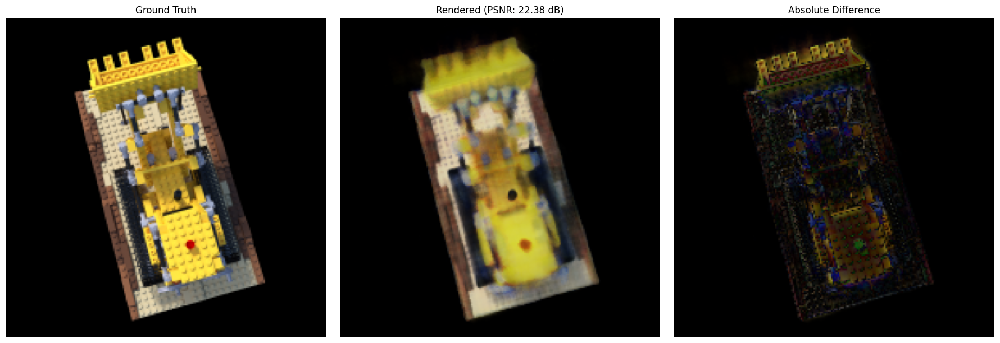


✓ Rendering complete!


In [ ]:
# Render a full validation image
# Define rendering parameters (same as training configuration)
n_samples = 64  # Number of samples per ray
near = 2.0
far = 6.0

print("Rendering validation images...")
print("=" * 70)

model_nerf.eval()

# Render first validation image
val_idx = 0
val_image = images_val[val_idx]  # (H, W, 3)
val_c2w = c2ws_val[val_idx]  # (4, 4)
H, W = val_image.shape[:2]

print(f"Rendering validation image {val_idx} ({H}x{W})...")

# Generate rays for all pixels
val_rays_o = []
val_rays_d = []
val_pixels_gt = []

for y in range(H):
    for x in range(W):
        uv = np.array([x + 0.5, y + 0.5])
        ray_o, ray_d = pixel_to_ray(K, val_c2w, uv)
        val_rays_o.append(ray_o)
        val_rays_d.append(ray_d)
        val_pixels_gt.append(val_image[y, x])

val_rays_o = np.array(val_rays_o)  # (H*W, 3)
val_rays_d = np.array(val_rays_d)  # (H*W, 3)
val_pixels_gt = np.array(val_pixels_gt)  # (H*W, 3)

# Render in batches to avoid memory issues
batch_size_render = 1024
rendered_pixels = []

with torch.no_grad():
    for i in range(0, len(val_rays_o), batch_size_render):
        batch_rays_o = val_rays_o[i:i+batch_size_render]
        batch_rays_d = val_rays_d[i:i+batch_size_render]
        
        # Sample points
        batch_points, batch_t_vals = sample_along_rays(
            batch_rays_o, batch_rays_d,
            near=near, far=far,
            n_samples=n_samples,
            perturb=False  # No perturbation during inference
        )
        
        # Predict
        batch_points_tensor = torch.from_numpy(batch_points).float().to(device)
        batch_viewdirs_tensor = torch.from_numpy(batch_rays_d).float().to(device)
        batch_viewdirs_tensor = batch_viewdirs_tensor[:, None, :].expand(-1, n_samples, -1)
        
        batch_densities, batch_colors = model_nerf(batch_points_tensor, batch_viewdirs_tensor)
        
        # Volume render
        batch_densities_np = batch_densities.cpu().numpy()
        batch_colors_np = batch_colors.cpu().numpy()
        batch_rendered, _ = volume_render(batch_densities_np, batch_colors_np, batch_t_vals, batch_rays_d)
        
        rendered_pixels.append(batch_rendered)
        
        if (i // batch_size_render + 1) % 10 == 0:
            print(f"  Rendered {min(i+batch_size_render, len(val_rays_o))}/{len(val_rays_o)} pixels...")

rendered_pixels = np.concatenate(rendered_pixels, axis=0)
rendered_image = rendered_pixels.reshape(H, W, 3)

# Compute metrics
val_mse = np.mean((rendered_image - val_image) ** 2)
val_psnr = -10 * np.log10(val_mse) if val_mse > 0 else float('inf')

print(f"\nValidation metrics:")
print(f"  MSE: {val_mse:.6f}")
print(f"  PSNR: {val_psnr:.2f} dB")

# Visualize
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(val_image)
axes[0].set_title('Ground Truth')
axes[0].axis('off')

axes[1].imshow(rendered_image)
axes[1].set_title(f'Rendered (PSNR: {val_psnr:.2f} dB)')
axes[1].axis('off')

diff = np.abs(val_image - rendered_image)
axes[2].imshow(diff)
axes[2].set_title('Absolute Difference')
axes[2].axis('off')

plt.tight_layout()
plt.show()

print("\n✓ Rendering complete!")


## Part 2.6: Deliverable - Novel View GIF and Intermediate Renders

Generate GIF of camera circling the object and intermediate training renders.


In [ ]:
# Part 2.6 Deliverable: Generate GIF of camera circling the lafufu object
# Create a circular camera path around the object

import math
import numpy as np

def look_at_origin(pos):
    """Camera looks towards the origin"""
    forward = -pos / np.linalg.norm(pos)  # Normalize the direction vector
    # Define up vector (assuming y-up)
    up = np.array([0, 1, 0])
    # Compute right vector using cross product
    right = np.cross(up, forward)
    right = right / np.linalg.norm(right)
    # Recompute up vector to ensure orthogonality
    up = np.cross(forward, right)
    # Create the camera-to-world matrix
    c2w = np.eye(4)
    c2w[:3, 0] = right
    c2w[:3, 1] = up
    c2w[:3, 2] = forward
    c2w[:3, 3] = pos
    return c2w

def rot_x(phi):
    """Rotation around x-axis"""
    return np.array([
        [math.cos(phi), -math.sin(phi), 0, 0],
        [math.sin(phi), math.cos(phi), 0, 0],
        [0, 0, 1, 0],
        [0, 0, 0, 1],
    ])

# Determine a good starting position from training camera extrinsics
# Use the average camera position as reference
if len(c2ws_train_lafufu) > 0:
    avg_camera_pos = np.mean([c2w[:3, 3] for c2w in c2ws_train_lafufu], axis=0)
    # Use a position at a reasonable distance
    START_POS = avg_camera_pos * 1.5  # Scale up a bit
    # Ensure minimum distance
    if np.linalg.norm(START_POS) < 0.1:
        START_POS = np.array([0.3, 0.2, 0.3])
else:
    START_POS = np.array([0.3, 0.2, 0.3])

NUM_SAMPLES = 60  # Number of frames in the GIF

print("Generating circular camera path...")
print(f"Starting position: {START_POS}")
print(f"Number of frames: {NUM_SAMPLES}")

# Generate camera poses for circular path
circular_c2ws = []
for phi in np.linspace(360., 0., NUM_SAMPLES, endpoint=False):
    c2w = look_at_origin(START_POS)
    extrinsic = rot_x(phi/180.*np.pi) @ c2w
    circular_c2ws.append(extrinsic)

print(f"✓ Generated {len(circular_c2ws)} camera poses")

# Render frames from these camera poses
print("\nRendering frames for GIF...")
model_nerf_lafufu.eval()

H_lafufu_render, W_lafufu_render = images_train_lafufu.shape[1:3]
frames_lafufu = []

for frame_idx, c2w_circular in enumerate(circular_c2ws):
    if (frame_idx + 1) % 10 == 0:
        print(f"  Rendering frame {frame_idx + 1}/{NUM_SAMPLES}...")
    
    # Generate all rays for this camera
    y_coords, x_coords = np.meshgrid(
        np.arange(H_lafufu_render), 
        np.arange(W_lafufu_render), 
        indexing='ij'
    )
    all_uvs = np.stack([x_coords.flatten() + 0.5, y_coords.flatten() + 0.5], axis=1)
    rays_o_circular, rays_d_circular = pixel_to_ray(K_lafufu, c2w_circular, all_uvs)
    
    # Render in batches
    batch_size_render = 512  # Smaller batch for larger images
    rendered_pixels = []
    
    with torch.no_grad():
        for i in range(0, len(rays_o_circular), batch_size_render):
            batch_rays_o = rays_o_circular[i:i+batch_size_render]
            batch_rays_d = rays_d_circular[i:i+batch_size_render]
            
            batch_points, batch_t_vals = sample_along_rays(
                batch_rays_o, batch_rays_d,
                near=near_lafufu, far=far_lafufu,
                n_samples=n_samples_lafufu,
                perturb=False
            )
            
            batch_points_tensor = torch.from_numpy(batch_points).float().to(device_lafufu)
            batch_viewdirs_tensor = torch.from_numpy(batch_rays_d).float().to(device_lafufu)
            batch_viewdirs_tensor = batch_viewdirs_tensor[:, None, :].expand(-1, n_samples_lafufu, -1)
            
            batch_densities, batch_colors = model_nerf_lafufu(batch_points_tensor, batch_viewdirs_tensor)
            
            batch_densities_np = batch_densities.cpu().numpy()
            batch_colors_np = batch_colors.cpu().numpy()
            batch_rendered, _ = volume_render(batch_densities_np, batch_colors_np, batch_t_vals, batch_rays_d)
            
            rendered_pixels.append(batch_rendered)
    
    rendered_pixels = np.concatenate(rendered_pixels, axis=0)
    rendered_frame = rendered_pixels.reshape(H_lafufu_render, W_lafufu_render, 3)
    
    # Clip to [0, 1] and convert to uint8
    rendered_frame = np.clip(rendered_frame, 0, 1)
    rendered_frame_uint8 = (rendered_frame * 255).astype(np.uint8)
    
    frames_lafufu.append(rendered_frame_uint8)

# Save as GIF
try:
    import imageio
    gif_path_lafufu = 'lafufu_novel_views.gif'
    print(f"\nSaving GIF to {gif_path_lafufu}...")
    imageio.mimsave(gif_path_lafufu, frames_lafufu, duration=0.15, loop=0)
    print(f"✓ GIF saved: {gif_path_lafufu}")
except ImportError:
    print("\n⚠ imageio not available. Install with: pip install imageio")
    print("Frames are stored in 'frames_lafufu' variable.")

print("\n✓ Novel view GIF generation complete!")


In [ ]:
# Part 2.6 Deliverable: Render intermediate training images
# Load checkpoints and render validation images at different training stages

print("Rendering intermediate training images...")
print("=" * 70)

# Check if checkpoints exist
import os
checkpoint_dir = "lafufu_checkpoints"
checkpoint_files = []

if os.path.exists(checkpoint_dir):
    checkpoint_files = sorted([f for f in os.listdir(checkpoint_dir) if f.endswith('.pth')])
    print(f"Found {len(checkpoint_files)} checkpoint files")

if len(checkpoint_files) > 0:
    # Load checkpoints and render
    intermediate_renders = []
    
    # Also include final model
    checkpoints_to_load = checkpoint_files + ['final']  # Add final model
    
    for checkpoint_name in checkpoints_to_load:
        if checkpoint_name == 'final':
            # Use current model
            model_to_render = model_nerf_lafufu
            iter_label = f"Final ({len(train_losses_lafufu)} iterations)"
        else:
            # Load checkpoint
            checkpoint_path = os.path.join(checkpoint_dir, checkpoint_name)
            checkpoint = torch.load(checkpoint_path, map_location=device_lafufu)
            model_to_render = NeRF(
                pe_L_coords=10,
                pe_L_viewdir=4,
                hidden_dim=256,
                num_layers=8
            ).to(device_lafufu)
            model_to_render.load_state_dict(checkpoint['model_state_dict'])
            iter_num = checkpoint['iteration']
            iter_label = f"Iteration {iter_num}"
        
        print(f"\nRendering with {iter_label}...")
        model_to_render.eval()
        
        # Render first validation image
        val_idx = 0
        val_image_inter = images_val_lafufu[val_idx]
        val_c2w_inter = c2ws_val_lafufu[val_idx]
        H_inter, W_inter = val_image_inter.shape[:2]
        
        # Generate rays (vectorized)
        y_coords, x_coords = np.meshgrid(
            np.arange(H_inter), 
            np.arange(W_inter), 
            indexing='ij'
        )
        all_uvs = np.stack([x_coords.flatten() + 0.5, y_coords.flatten() + 0.5], axis=1)
        val_rays_o_inter, val_rays_d_inter = pixel_to_ray(K_lafufu, val_c2w_inter, all_uvs)
        
        # Render in batches
        batch_size_render = 512
        rendered_pixels_inter = []
        
        with torch.no_grad():
            for i in range(0, len(val_rays_o_inter), batch_size_render):
                batch_rays_o = val_rays_o_inter[i:i+batch_size_render]
                batch_rays_d = val_rays_d_inter[i:i+batch_size_render]
                
                batch_points, batch_t_vals = sample_along_rays(
                    batch_rays_o, batch_rays_d,
                    near=near_lafufu, far=far_lafufu,
                    n_samples=n_samples_lafufu,
                    perturb=False
                )
                
                batch_points_tensor = torch.from_numpy(batch_points).float().to(device_lafufu)
                batch_viewdirs_tensor = torch.from_numpy(batch_rays_d).float().to(device_lafufu)
                batch_viewdirs_tensor = batch_viewdirs_tensor[:, None, :].expand(-1, n_samples_lafufu, -1)
                
                batch_densities, batch_colors = model_to_render(batch_points_tensor, batch_viewdirs_tensor)
                
                batch_densities_np = batch_densities.cpu().numpy()
                batch_colors_np = batch_colors.cpu().numpy()
                batch_rendered, _ = volume_render(batch_densities_np, batch_colors_np, batch_t_vals, batch_rays_d)
                
                rendered_pixels_inter.append(batch_rendered)
        
        rendered_pixels_inter = np.concatenate(rendered_pixels_inter, axis=0)
        rendered_image_inter = rendered_pixels_inter.reshape(H_inter, W_inter, 3)
        
        intermediate_renders.append({
            'label': iter_label,
            'rendered': rendered_image_inter,
            'gt': val_image_inter
        })
    
    # Visualize intermediate renders
    num_renders = len(intermediate_renders)
    fig, axes = plt.subplots(2, num_renders, figsize=(5 * num_renders, 10))
    
    if num_renders == 1:
        axes = axes.reshape(2, 1)
    
    for i, result in enumerate(intermediate_renders):
        axes[0, i].imshow(result['gt'])
        axes[0, i].set_title('Ground Truth')
        axes[0, i].axis('off')
        
        axes[1, i].imshow(result['rendered'])
        axes[1, i].set_title(result['label'])
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.savefig('lafufu_intermediate_renders.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print("\n✓ Intermediate renders saved to 'lafufu_intermediate_renders.png'")
else:
    print("⚠ No checkpoints found. Rendering with final model only...")
    # Render with final model
    model_nerf_lafufu.eval()
    
    val_idx = 0
    val_image_inter = images_val_lafufu[val_idx]
    val_c2w_inter = c2ws_val_lafufu[val_idx]
    H_inter, W_inter = val_image_inter.shape[:2]
    
    # Generate rays and render (same as above)
    y_coords, x_coords = np.meshgrid(
        np.arange(H_inter), 
        np.arange(W_inter), 
        indexing='ij'
    )
    all_uvs = np.stack([x_coords.flatten() + 0.5, y_coords.flatten() + 0.5], axis=1)
    val_rays_o_inter, val_rays_d_inter = pixel_to_ray(K_lafufu, val_c2w_inter, all_uvs)
    
    batch_size_render = 512
    rendered_pixels_inter = []
    
    with torch.no_grad():
        for i in range(0, len(val_rays_o_inter), batch_size_render):
            batch_rays_o = val_rays_o_inter[i:i+batch_size_render]
            batch_rays_d = val_rays_d_inter[i:i+batch_size_render]
            
            batch_points, batch_t_vals = sample_along_rays(
                batch_rays_o, batch_rays_d,
                near=near_lafufu, far=far_lafufu,
                n_samples=n_samples_lafufu,
                perturb=False
            )
            
            batch_points_tensor = torch.from_numpy(batch_points).float().to(device_lafufu)
            batch_viewdirs_tensor = torch.from_numpy(batch_rays_d).float().to(device_lafufu)
            batch_viewdirs_tensor = batch_viewdirs_tensor[:, None, :].expand(-1, n_samples_lafufu, -1)
            
            batch_densities, batch_colors = model_nerf_lafufu(batch_points_tensor, batch_viewdirs_tensor)
            
            batch_densities_np = batch_densities.cpu().numpy()
            batch_colors_np = batch_colors.cpu().numpy()
            batch_rendered, _ = volume_render(batch_densities_np, batch_colors_np, batch_t_vals, batch_rays_d)
            
            rendered_pixels_inter.append(batch_rendered)
    
    rendered_pixels_inter = np.concatenate(rendered_pixels_inter, axis=0)
    rendered_image_inter = rendered_pixels_inter.reshape(H_inter, W_inter, 3)
    
    # Visualize
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(val_image_inter)
    axes[0].set_title('Ground Truth')
    axes[0].axis('off')
    axes[1].imshow(rendered_image_inter)
    axes[1].set_title('Final Model')
    axes[1].axis('off')
    plt.tight_layout()
    plt.savefig('lafufu_final_render.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print("\n✓ Final render saved to 'lafufu_final_render.png'")


In [ ]:
# Part 2.6 Deliverable: Save training loss plot
# Create and save the training loss plot for lafufu

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Loss curve
axes[0].plot(train_losses_lafufu)
axes[0].set_xlabel('Iteration')
axes[0].set_ylabel('MSE Loss')
axes[0].set_title('Lafufu Training Loss')
axes[0].grid(True, alpha=0.3)
axes[0].set_yscale('log')

# PSNR curve
axes[1].plot(train_psnrs_lafufu)
axes[1].set_xlabel('Iteration')
axes[1].set_ylabel('PSNR (dB)')
axes[1].set_title('Lafufu Training PSNR')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('lafufu_training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Training curves saved to 'lafufu_training_curves.png'")
print(f"\nFinal metrics:")
print(f"  Final Loss: {train_losses_lafufu[-1]:.6f}")
print(f"  Final PSNR: {train_psnrs_lafufu[-1]:.2f} dB")


## Part 2: Deliverable - Validation PSNR Curve

Plot PSNR curve on validation set.


In [ ]:
# Part 2 Deliverable: Compute and plot validation PSNR
# Render all validation images and compute PSNR

print("Computing validation PSNR...")
print("=" * 70)

model_nerf.eval()

val_psnrs = []

for val_idx in range(len(images_val)):
    print(f"Rendering validation image {val_idx + 1}/{len(images_val)}...")
    val_image = images_val[val_idx]
    val_c2w = c2ws_val[val_idx]
    H_val, W_val = val_image.shape[:2]
    
    # Generate all rays (vectorized)
    y_coords, x_coords = np.meshgrid(
        np.arange(H_val), 
        np.arange(W_val), 
        indexing='ij'
    )
    all_uvs = np.stack([x_coords.flatten() + 0.5, y_coords.flatten() + 0.5], axis=1)
    val_rays_o, val_rays_d = pixel_to_ray(K, val_c2w, all_uvs)
    
    # Render in batches
    batch_size_render = 1024
    rendered_pixels = []
    
    with torch.no_grad():
        for i in range(0, len(val_rays_o), batch_size_render):
            batch_rays_o = val_rays_o[i:i+batch_size_render]
            batch_rays_d = val_rays_d[i:i+batch_size_render]
            
            batch_points, batch_t_vals = sample_along_rays(
                batch_rays_o, batch_rays_d,
                near=near, far=far,
                n_samples=n_samples,
                perturb=False
            )
            
            batch_points_tensor = torch.from_numpy(batch_points).float().to(device)
            batch_viewdirs_tensor = torch.from_numpy(batch_rays_d).float().to(device)
            batch_viewdirs_tensor = batch_viewdirs_tensor[:, None, :].expand(-1, n_samples, -1)
            
            batch_densities, batch_colors = model_nerf(batch_points_tensor, batch_viewdirs_tensor)
            
            batch_densities_np = batch_densities.cpu().numpy()
            batch_colors_np = batch_colors.cpu().numpy()
            batch_rendered, _ = volume_render(batch_densities_np, batch_colors_np, batch_t_vals, batch_rays_d)
            
            rendered_pixels.append(batch_rendered)
    
    rendered_pixels = np.concatenate(rendered_pixels, axis=0)
    rendered_image = rendered_pixels.reshape(H_val, W_val, 3)
    
    # Compute PSNR
    val_mse = np.mean((rendered_image - val_image) ** 2)
    val_psnr = -10 * np.log10(val_mse) if val_mse > 0 else float('inf')
    val_psnrs.append(val_psnr)
    
    print(f"  PSNR: {val_psnr:.2f} dB")

# Plot validation PSNR
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.plot(range(1, len(val_psnrs) + 1), val_psnrs, 'o-', linewidth=2, markersize=8)
ax.set_xlabel('Validation Image Index', fontsize=12)
ax.set_ylabel('PSNR (dB)', fontsize=12)
ax.set_title('Validation PSNR', fontsize=14)
ax.grid(True, alpha=0.3)
ax.set_xticks(range(1, len(val_psnrs) + 1))

# Add average line
avg_psnr = np.mean(val_psnrs)
ax.axhline(y=avg_psnr, color='r', linestyle='--', linewidth=2, label=f'Average: {avg_psnr:.2f} dB')
ax.legend()

plt.tight_layout()
plt.savefig('part2_validation_psnr.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\n✓ Validation PSNR plot saved to 'part2_validation_psnr.png'")
print(f"Average validation PSNR: {avg_psnr:.2f} dB")
print(f"Individual PSNRs: {[f'{p:.2f}' for p in val_psnrs]}")


## Deliverables Summary

This section summarizes all the deliverables generated in this notebook.


In [ ]:
# Deliverables Summary
# List all generated deliverables and their locations

print("=" * 70)
print("PROJECT DELIVERABLES SUMMARY")
print("=" * 70)

deliverables = {
    "Part 0: Camera Calibration and 3D Scanning": [
        ("Camera Frustum Visualization 1", "Run cells 9-10 to generate Viser visualizations"),
        ("Camera Frustum Visualization 2", "Take screenshots from the Viser URLs"),
    ],
    "Part 1: Fit a Neural Field to a 2D Image": [
        ("Model Architecture Report", "See cells 16, 18 for architecture details"),
        ("Training Progression - Fox Image", "Cell 22 shows training progression"),
        ("Training Progression - Custom Image (IMG_6300.jpg)", "Cell 33 shows training progression"),
        ("Hyperparameter Sweep Results (2x2 grid)", "Cell 26 shows results for different pe_L and hidden_dim"),
        ("PSNR Curve", "Cell 23 shows PSNR curve for fox image, Cell 34 for custom image"),
    ],
    "Part 2: Fit a Neural Radiance Field from Multi-view Images": [
        ("Implementation Description", "See code comments in main.py and notebook cells"),
        ("Rays and Samples Visualization", "Cell 51 - Viser visualization with cameras, rays, and samples"),
        ("Training Progression Visualization", "Cell 66 - Saved to 'part2_training_progression.png'"),
        ("Validation PSNR Curve", "Cell 79 - Saved to 'part2_validation_psnr.png'"),
        ("Spherical Rendering Video (Lego)", "Cell 68 - Saved to 'lego_spherical_rendering.gif'"),
    ],
    "Part 2.6: Training with Your Own Data (Lafufu)": [
        ("Novel View GIF", "Cell 75 - Saved to 'lafufu_novel_views.gif'"),
        ("Training Loss Plot", "Cell 77 - Saved to 'lafufu_training_curves.png'"),
        ("Intermediate Renders", "Cell 76 - Saved to 'lafufu_intermediate_renders.png' or 'lafufu_final_render.png'"),
        ("Hyperparameter Discussion", "See cell 70 for training configuration and any adjustments made"),
    ],
}

for part, items in deliverables.items():
    print(f"\n{part}:")
    print("-" * 70)
    for i, (name, location) in enumerate(items, 1):
        print(f"  {i}. {name}")
        print(f"     → {location}")

print("\n" + "=" * 70)
print("GENERATED FILES:")
print("=" * 70)
print("""
Part 2 Deliverables:
  - part2_training_progression.png
  - part2_validation_psnr.png
  - lego_spherical_rendering.gif
  - lego_frame_*.png (preview frames)

Part 2.6 Deliverables:
  - lafufu_novel_views.gif
  - lafufu_training_curves.png
  - lafufu_intermediate_renders.png (or lafufu_final_render.png)

Note: Part 0 and Part 1 visualizations are displayed inline in the notebook.
For Part 0 camera frustums, take screenshots from the Viser URLs shown.
""")

print("\n✓ All deliverables are ready!")
print("\nTo generate all deliverables, run the cells in order:")
print("  1. Part 0: Cells 9-10 (camera frustum visualizations)")
print("  2. Part 1: Cells 22, 23, 26, 33, 34 (already generated)")
print("  3. Part 2: Cells 51, 66, 68, 79 (rays, progression, video, PSNR)")
print("  4. Part 2.6: Cells 75, 76, 77 (GIF, intermediate renders, loss plot)")


## Part 2.6: Training NeRF on Lafufu Dataset

Train the NeRF model on the lafufu dataset

In [ ]:
# Imports
import sys
import numpy as np
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

# Import functions from main.py
from main import *
print("Imports successful!")


Imports successful!


In [ ]:
# Process lafufu images and create dataset
print("Processing lafufu images from directory...")
print("=" * 70)

# Import required functions
from main import (
    calibrate_camera,
    estimate_camera_poses,
    create_dataset
)

# Load camera calibration (or calibrate if needed)
calibration_path = "camera_calibration.npz"
lafufu_images_dir = "../images/lafufu"
tag_size = 0.02  # ArUco tag size in meters

print(f"\nStep 1: Loading camera calibration...")
try:
    # Try to load existing calibration
    calib_data = np.load(calibration_path)
    camera_matrix = calib_data["camera_matrix"]
    dist_coeffs = calib_data["dist_coeffs"]
    print(f"✓ Loaded calibration from {calibration_path}")
    print(f"  Camera matrix shape: {camera_matrix.shape}")
    print(f"  Distortion coefficients shape: {dist_coeffs.shape}")
except FileNotFoundError:
    # Calibrate camera if calibration doesn't exist
    print(f"Calibration file not found. Calibrating camera...")
    calibration_images_dir = "../images/calibration_images"
    camera_matrix, dist_coeffs, image_size, error = calibrate_camera(
        calibration_images_dir,
        tag_size=tag_size
    )
    print(f"✓ Camera calibrated (reprojection error: {error:.4f} pixels)")

# Step 2: Estimate camera poses for lafufu images (MORE LENIENT - use first tag if multiple found)
print(f"\nStep 2: Estimating camera poses for images in {lafufu_images_dir}...")
print("Using lenient mode: will use first tag if multiple tags are detected")

# Import additional functions for lenient pose estimation
from main import get_image_files, detect_aruco, get_tag_corners_3d
import os

# Define 3D world coordinates for the ArUco tag corners
obj_points = get_tag_corners_3d(tag_size)

# Get all image files from the directory
image_files = get_image_files(lafufu_images_dir)
print(f"Found {len(image_files)} images in {lafufu_images_dir}")

c2ws = []  # Camera-to-world transformation matrices
images = []  # Images with successful pose estimation
image_paths = []  # Paths of images with successful pose estimation

# Loop through all images
for image_path in image_files:
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Could not read image {image_path}, skipping...")
        continue
    
    # Detect ArUco markers in the image
    corners, ids = detect_aruco(image)
    
    # More lenient: use first tag if multiple tags are detected
    if ids is not None and len(ids) >= 1:
        # Use the first tag (index 0)
        if len(ids) > 1:
            print(f"Found {len(ids)} tags in {os.path.basename(image_path)}, using first tag...")
        
        # Extract corner coordinates for the first detected tag
        # corners[0] has shape (1, 4, 2), reshape to (4, 2)
        image_points = corners[0][0].astype(np.float32)
        
        # Reshape for solvePnP: (4, 2) -> (4, 1, 2)
        image_points_pnp = image_points.reshape(-1, 1, 2)
        # Reshape object points: (4, 3) -> (4, 1, 3)
        object_points_pnp = obj_points.reshape(-1, 1, 3)
        
        # Use solvePnP to estimate camera pose
        success, rvec, tvec = cv2.solvePnP(
            object_points_pnp,
            image_points_pnp,
            camera_matrix,
            dist_coeffs
        )
        
        if success:
            # Convert rotation vector to rotation matrix
            R, _ = cv2.Rodrigues(rvec)
            
            # OpenCV's solvePnP returns world-to-camera transformation
            # We need to invert it to get camera-to-world (c2w)
            # w2c = [R | t], so c2w = [R^T | -R^T * t]
            w2c = np.eye(4)
            w2c[:3, :3] = R
            w2c[:3, 3] = tvec.flatten()
            
            # Invert to get c2w
            c2w = np.linalg.inv(w2c)
            
            c2ws.append(c2w)
            images.append(image)
            image_paths.append(image_path)
        else:
            print(f"Warning: solvePnP failed for {os.path.basename(image_path)}, skipping...")
    else:
        # No tag detected, skip this image
        print(f"No tag detected in {os.path.basename(image_path)}, skipping...")
        continue

print(f"\n✓ Successfully estimated poses for {len(c2ws)} images")
if len(c2ws) == 0:
    raise ValueError("No images with valid poses found! Check that images contain at least one ArUco tag.")

# Step 3: Create dataset with adjusted split ratios
print(f"\nStep 3: Creating dataset...")
output_dataset_path = "lafufu_data.npz"

# Adjust split ratios based on number of images
num_images = len(images)
if num_images < 3:
    # Very few images: use all for training (no val/test)
    train_ratio = 1.0
    val_ratio = 0.0
    print(f"  Very few images ({num_images}): Using all for training")
elif num_images < 10:
    # Very few images: use most for training, ensure at least 1 train
    train_ratio = max(0.9, 1.0 - (2.0 / num_images))  # Ensure at least 2 for val+test
    val_ratio = 0.1
    print(f"  Few images ({num_images}): Using {train_ratio:.0%} train, {val_ratio:.0%} val")
elif num_images < 20:
    # Few images: use more for training
    train_ratio = 0.85
    val_ratio = 0.15
    print(f"  Few images ({num_images}): Using {train_ratio:.0%} train, {val_ratio:.0%} val")
else:
    # Normal split
    train_ratio = 0.8
    val_ratio = 0.1
    print(f"  Normal split ({num_images} images): Using {train_ratio:.0%} train, {val_ratio:.0%} val")

create_dataset(
    images,
    c2ws,
    camera_matrix,
    dist_coeffs,
    output_path=output_dataset_path,
    train_ratio=train_ratio,
    val_ratio=val_ratio,
    crop_black_borders=True
)

print(f"✓ Dataset created: {output_dataset_path}")

# Step 4: Load the created dataset
print(f"\nStep 4: Loading dataset for training...")
data_lafufu_loaded = np.load(output_dataset_path)

# Extract arrays from the npz file (they're read-only, so we need to copy them)
images_train_lafufu_raw = data_lafufu_loaded["images_train"].copy() if data_lafufu_loaded["images_train"].size > 0 else np.array([])
c2ws_train_lafufu_raw = data_lafufu_loaded["c2ws_train"].copy()
images_val_lafufu_raw = data_lafufu_loaded["images_val"].copy() if data_lafufu_loaded["images_val"].size > 0 else np.array([])
c2ws_val_lafufu_raw = data_lafufu_loaded["c2ws_val"].copy()
c2ws_test_lafufu_raw = data_lafufu_loaded["c2ws_test"].copy()
focal_lafufu_raw = float(data_lafufu_loaded["focal"])

# OPTIONAL: Resize images to smaller resolution for faster training
RESIZE_IMAGES = True  # Set to False to keep original resolution
TARGET_SIZE = 800  # Target max dimension (maintains aspect ratio)

if RESIZE_IMAGES:
    print(f"\nResizing images to max dimension {TARGET_SIZE}px for faster processing...")
    import cv2
    
    # Get original dimensions
    if images_train_lafufu_raw.size > 0:
        orig_h, orig_w = images_train_lafufu_raw.shape[1:3]
    elif images_val_lafufu_raw.size > 0:
        orig_h, orig_w = images_val_lafufu_raw.shape[1:3]
    else:
        orig_h, orig_w = 4283, 5711  # Fallback
    
    # Calculate new dimensions
    if orig_h > orig_w:
        new_h = TARGET_SIZE
        new_w = int(orig_w * TARGET_SIZE / orig_h)
    else:
        new_w = TARGET_SIZE
        new_h = int(orig_h * TARGET_SIZE / orig_w)
    
    print(f"  Original size: {orig_h}x{orig_w}")
    print(f"  New size: {new_h}x{new_w}")
    
    # Resize training images
    if images_train_lafufu_raw.size > 0:
        resized_train = []
        for img in images_train_lafufu_raw:
            resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
            resized_train.append(resized)
        images_train_lafufu_raw = np.array(resized_train)
        print(f"  Resized {len(resized_train)} training images")
    
    # Resize validation images
    if images_val_lafufu_raw.size > 0:
        resized_val = []
        for img in images_val_lafufu_raw:
            resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
            resized_val.append(resized)
        images_val_lafufu_raw = np.array(resized_val)
        print(f"  Resized {len(resized_val)} validation images")
    
    # Update focal length proportionally
    scale_factor = new_w / orig_w  # Use width scale
    focal_lafufu_raw = focal_lafufu_raw * scale_factor
    print(f"  Updated focal length: {focal_lafufu_raw:.2f} (scaled by {scale_factor:.3f})")
    
    # Save resized dataset
    np.savez(
        output_dataset_path,
        images_train=images_train_lafufu_raw,
        c2ws_train=c2ws_train_lafufu_raw,
        images_val=images_val_lafufu_raw,
        c2ws_val=c2ws_val_lafufu_raw,
        c2ws_test=c2ws_test_lafufu_raw,
        focal=focal_lafufu_raw
    )
    print(f"  Saved resized dataset to {output_dataset_path}")

# Training images: normalize to [0, 1]
images_train_lafufu = images_train_lafufu_raw / 255.0

# Cameras for the training images (camera-to-world transformation matrix)
c2ws_train_lafufu = c2ws_train_lafufu_raw

# Validation images
images_val_lafufu = images_val_lafufu_raw / 255.0

# Cameras for the validation images
c2ws_val_lafufu = c2ws_val_lafufu_raw

# Test cameras for novel-view video rendering
c2ws_test_lafufu = c2ws_test_lafufu_raw

# Camera focal length
focal_lafufu = focal_lafufu_raw  # float

print(f"\n✓ Dataset loaded successfully!")
print(f"  Training images: {images_train_lafufu.shape}")
print(f"  Training cameras: {c2ws_train_lafufu.shape}")
print(f"  Validation images: {images_val_lafufu.shape}")
print(f"  Validation cameras: {c2ws_val_lafufu.shape}")
print(f"  Test cameras: {c2ws_test_lafufu.shape}")
print(f"  Focal length: {focal_lafufu:.2f}")

# Get image dimensions
H_lafufu, W_lafufu = images_train_lafufu.shape[1:3]
print(f"  Image size: {H_lafufu}x{W_lafufu}")

# Create camera intrinsic matrix K
K_lafufu = np.array([
    [focal_lafufu, 0, W_lafufu / 2.0],
    [0, focal_lafufu, H_lafufu / 2.0],
    [0, 0, 1]
])

print(f"\nCamera intrinsic matrix K:")
print(K_lafufu)


Processing lafufu images from directory...

Step 1: Loading camera calibration...
✓ Loaded calibration from camera_calibration.npz
  Camera matrix shape: (3, 3)
  Distortion coefficients shape: (1, 5)

Step 2: Estimating camera poses for images in ../images/lafufu...
Using lenient mode: will use first tag if multiple tags are detected
Found 33 images in ../images/lafufu
Found 3 tags in IMG_5311.JPG, using first tag...
Found 2 tags in IMG_5312.JPG, using first tag...
Found 2 tags in IMG_5313.JPG, using first tag...
Found 2 tags in IMG_5314.JPG, using first tag...
Found 3 tags in IMG_5315.JPG, using first tag...
Found 3 tags in IMG_5316.JPG, using first tag...
Found 3 tags in IMG_5317.JPG, using first tag...
Found 3 tags in IMG_5318.JPG, using first tag...
Found 3 tags in IMG_5319.JPG, using first tag...
Found 3 tags in IMG_5320.JPG, using first tag...
Found 3 tags in IMG_5321.JPG, using first tag...
Found 2 tags in IMG_5322.JPG, using first tag...
Found 3 tags in IMG_5323.JPG, using fir

In [ ]:
print(f"Training images shape: {images_train_lafufu.shape}")
print(f"Validation images shape: {images_val_lafufu.shape}")
print(f"Training c2ws shape: {c2ws_train_lafufu.shape}")
print(f"Validation c2ws shape: {c2ws_val_lafufu.shape}")

Training images shape: (26, 599, 800, 3)
Validation images shape: (3, 599, 800, 3)
Training c2ws shape: (26, 4, 4)
Validation c2ws shape: (3, 4, 4)


In [ ]:
# Create RaysData dataloader for lafufu
print("Creating RaysData dataloader for lafufu...")
print("=" * 70)

from main import RaysData

dataset_lafufu = RaysData(images_train_lafufu, c2ws_train_lafufu, K_lafufu)

print(f"✓ Dataset created!")
print(f"  Total pixels: {len(dataset_lafufu.pixels):,}")
print(f"  Total rays: {len(dataset_lafufu.rays_o):,}")


Creating RaysData dataloader for lafufu...
Initializing RaysData: 26 images, 599x800 pixels each
  Created 479200 UV coordinates
  Computing rays for 26 images...


    Processed 2/26 images...
    Processed 4/26 images...
    Processed 6/26 images...
    Processed 8/26 images...
    Processed 10/26 images...
    Processed 12/26 images...
    Processed 14/26 images...
    Processed 16/26 images...
    Processed 18/26 images...
    Processed 20/26 images...
    Processed 22/26 images...
    Processed 24/26 images...
    Processed 26/26 images...
  Computed 12459200 rays total
✓ Dataset created!
  Total pixels: 12,459,200
  Total rays: 12,459,200


In [ ]:
# Training configuration for lafufu
print("Setting up training for lafufu...")
print("=" * 70)

# Import training functions
from main import volume_render, volume_render_torch, sample_along_rays, pixel_to_ray
import torch.optim as optim
import torch.nn as nn

# Hyperparameters
num_iterations_lafufu = 10000  # More iterations for better quality
batch_size_lafufu = 4096  # Number of rays per batch
learning_rate_lafufu = 5e-4
n_samples_lafufu = 64  # Number of samples per ray
near_lafufu = 0.1  # Adjust based on scene (may need tuning)
far_lafufu = 10.0  # Adjust based on scene (may need tuning)

# Device
device_lafufu = torch.device('cuda' if torch.cuda.is_available() else 
                             'mps' if torch.backends.mps.is_available() else 'cpu')
print(f"Using device: {device_lafufu}")

# Initialize model
model_nerf_lafufu = NeRF(
    pe_L_coords=10,
    pe_L_viewdir=4,
    hidden_dim=256,
    num_layers=8
).to(device_lafufu)

# Optimizer
optimizer_lafufu = optim.Adam(model_nerf_lafufu.parameters(), lr=learning_rate_lafufu)

# Loss function
criterion_lafufu = nn.MSELoss()

print(f"\nTraining configuration:")
print(f"  Iterations: {num_iterations_lafufu}")
print(f"  Batch size: {batch_size_lafufu} rays")
print(f"  Learning rate: {learning_rate_lafufu}")
print(f"  Samples per ray: {n_samples_lafufu}")
print(f"  Near/Far: {near_lafufu}/{far_lafufu}")
print(f"  Model parameters: {sum(p.numel() for p in model_nerf_lafufu.parameters()):,}")

# Training history
train_losses_lafufu = []
train_psnrs_lafufu = []


Setting up training for lafufu...
Using device: cuda

Training configuration:
  Iterations: 10000
  Batch size: 4096 rays
  Learning rate: 0.0005
  Samples per ray: 64
  Near/Far: 0.1/10.0
  Model parameters: 530,052


In [ ]:
# Training loop for lafufu with model checkpoint saving
print("\nStarting training on lafufu dataset...")
print("=" * 70)

# Calculate checkpoint iterations for model saving (33% and 66%)
checkpoint_1 = int(num_iterations_lafufu * 0.33)
checkpoint_2 = int(num_iterations_lafufu * 0.66)
checkpoints = [checkpoint_1, checkpoint_2]
print(f"Will save model checkpoints at iterations: {checkpoint_1} (33%), {checkpoint_2} (66%)")

# Function to save model checkpoint
def save_model_checkpoint(iteration, model, optimizer, train_losses, train_psnrs, 
                          output_dir="lafufu_checkpoints"):
    """Save model checkpoint including state dict, optimizer, and training history."""
    import os
    os.makedirs(output_dir, exist_ok=True)
    
    checkpoint_path = os.path.join(output_dir, f"lafufu_model_iter_{iteration}.pth")
    
    checkpoint = {
        'iteration': iteration,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_losses': train_losses,
        'train_psnrs': train_psnrs,
    }
    
    torch.save(checkpoint, checkpoint_path)
    print(f"  💾 Saved model checkpoint: {checkpoint_path}")
    print(f"     Current PSNR: {train_psnrs[-1]:.2f} dB, Loss: {train_losses[-1]:.6f}")

model_nerf_lafufu.train()

for iteration in range(num_iterations_lafufu):
    # Sample rays from training images
    rays_o, rays_d, pixels_gt = dataset_lafufu.sample_rays(batch_size_lafufu)
    
    # Sample points along rays
    points, t_vals = sample_along_rays(
        rays_o, rays_d, 
        near=near_lafufu, far=far_lafufu, 
        n_samples=n_samples_lafufu, 
        perturb=True
    )
    
    # Convert to tensors
    points_tensor = torch.from_numpy(points).float().to(device_lafufu)  # (batch_size, n_samples, 3)
    viewdirs_tensor = torch.from_numpy(rays_d).float().to(device_lafufu)  # (batch_size, 3)
    viewdirs_tensor = viewdirs_tensor[:, None, :].expand(-1, n_samples_lafufu, -1)  # (batch_size, n_samples, 3)
    pixels_gt_tensor = torch.from_numpy(pixels_gt).float().to(device_lafufu)  # (batch_size, 3)
    
    # Forward pass
    densities, colors = model_nerf_lafufu(points_tensor, viewdirs_tensor)
    
    # Volume rendering (PyTorch version for gradients)
    t_vals_tensor = torch.from_numpy(t_vals).float().to(device_lafufu)
    rendered_colors, _ = volume_render_torch(
        densities.squeeze(-1),  # (batch_size, n_samples)
        colors,  # (batch_size, n_samples, 3)
        t_vals_tensor,  # (batch_size, n_samples)
        torch.from_numpy(rays_d).float().to(device_lafufu)  # (batch_size, 3)
    )
    
    # Compute loss
    loss = criterion_lafufu(rendered_colors, pixels_gt_tensor)
    
    # Backward pass
    optimizer_lafufu.zero_grad()
    loss.backward()
    optimizer_lafufu.step()
    
    # Compute PSNR
    mse = loss.item()
    psnr = -10 * np.log10(mse) if mse > 0 else float('inf')
    
    train_losses_lafufu.append(mse)
    train_psnrs_lafufu.append(psnr)
    
    # Print progress
    if (iteration + 1) % 100 == 0:
        print(f"Iteration {iteration+1}/{num_iterations_lafufu}: Loss={mse:.6f}, PSNR={psnr:.2f} dB")
    
    # Save model checkpoints at 33% and 66%
    if (iteration + 1) in checkpoints:
        print(f"\n💾 Saving model checkpoint at iteration {iteration+1} ({100*(iteration+1)/num_iterations_lafufu:.1f}% complete)...")
        save_model_checkpoint(
            iteration + 1,
            model_nerf_lafufu,
            optimizer_lafufu,
            train_losses_lafufu,
            train_psnrs_lafufu
        )

print("\n✓ Training complete!")
print(f"\n✓ Model checkpoints saved to 'lafufu_checkpoints/' directory")



Starting training on lafufu dataset...
Will save model checkpoints at iterations: 3300 (33%), 6600 (66%)
Iteration 100/10000: Loss=0.075009, PSNR=11.25 dB
Iteration 200/10000: Loss=0.075867, PSNR=11.20 dB
Iteration 300/10000: Loss=0.074604, PSNR=11.27 dB
Iteration 400/10000: Loss=0.073248, PSNR=11.35 dB
Iteration 500/10000: Loss=0.075455, PSNR=11.22 dB
Iteration 600/10000: Loss=0.074947, PSNR=11.25 dB
Iteration 700/10000: Loss=0.072530, PSNR=11.39 dB
Iteration 800/10000: Loss=0.072064, PSNR=11.42 dB
Iteration 900/10000: Loss=0.070923, PSNR=11.49 dB
Iteration 1000/10000: Loss=0.071120, PSNR=11.48 dB
Iteration 1100/10000: Loss=0.072832, PSNR=11.38 dB
Iteration 1200/10000: Loss=0.071794, PSNR=11.44 dB
Iteration 1300/10000: Loss=0.070047, PSNR=11.55 dB
Iteration 1400/10000: Loss=0.070388, PSNR=11.53 dB
Iteration 1500/10000: Loss=0.071492, PSNR=11.46 dB
Iteration 1600/10000: Loss=0.069458, PSNR=11.58 dB
Iteration 1700/10000: Loss=0.069747, PSNR=11.56 dB
Iteration 1800/10000: Loss=0.069990,

In [ ]:
# Plot training curves for lafufu
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Loss curve
axes[0].plot(train_losses_lafufu)
axes[0].set_xlabel('Iteration')
axes[0].set_ylabel('MSE Loss')
axes[0].set_title('Lafufu Training Loss')
axes[0].grid(True, alpha=0.3)
axes[0].set_yscale('log')

# PSNR curve
axes[1].plot(train_psnrs_lafufu)
axes[1].set_xlabel('Iteration')
axes[1].set_ylabel('PSNR (dB)')
axes[1].set_title('Lafufu Training PSNR')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nFinal training metrics:")
print(f"  Final Loss: {train_losses_lafufu[-1]:.6f}")
print(f"  Final PSNR: {train_psnrs_lafufu[-1]:.2f} dB")


In [ ]:
# Render validation images for lafufu
print("Rendering validation images for lafufu...")
print("=" * 70)

model_nerf_lafufu.eval()

# Render validation image 0
val_idx_lafufu = 0
val_image_lafufu = images_val_lafufu[val_idx_lafufu]  # (H, W, 3)
val_c2w_lafufu = c2ws_val_lafufu[val_idx_lafufu]  # (4, 4)
H_val, W_val = val_image_lafufu.shape[:2]

print(f"Rendering validation image {val_idx_lafufu} ({H_val}x{W_val})...")

# Generate all rays for this image (VECTORIZED - much faster!)
print("Generating rays (vectorized)...")
y_coords, x_coords = np.meshgrid(
    np.arange(H_val), 
    np.arange(W_val), 
    indexing='ij'
)

# Flatten coordinates and add 0.5 offset for pixel center
all_uvs = np.stack([x_coords.flatten() + 0.5, y_coords.flatten() + 0.5], axis=1)  # (H*W, 2)

# Vectorized ray generation - call pixel_to_ray once with all UVs
val_rays_o_lafufu, val_rays_d_lafufu = pixel_to_ray(K_lafufu, val_c2w_lafufu, all_uvs)

print(f"✓ Generated {len(val_rays_o_lafufu):,} rays")

# Render in batches
batch_size_render_lafufu = 1024
rendered_pixels_lafufu = []

with torch.no_grad():
    for i in range(0, len(val_rays_o_lafufu), batch_size_render_lafufu):
        batch_rays_o = val_rays_o_lafufu[i:i+batch_size_render_lafufu]
        batch_rays_d = val_rays_d_lafufu[i:i+batch_size_render_lafufu]
        
        # Sample points
        batch_points, batch_t_vals = sample_along_rays(
            batch_rays_o, batch_rays_d,
            near=near_lafufu, far=far_lafufu,
            n_samples=n_samples_lafufu,
            perturb=False  # No perturbation during inference
        )
        
        # Predict
        batch_points_tensor = torch.from_numpy(batch_points).float().to(device_lafufu)
        batch_viewdirs_tensor = torch.from_numpy(batch_rays_d).float().to(device_lafufu)
        batch_viewdirs_tensor = batch_viewdirs_tensor[:, None, :].expand(-1, n_samples_lafufu, -1)
        
        batch_densities, batch_colors = model_nerf_lafufu(batch_points_tensor, batch_viewdirs_tensor)
        
        # Volume render
        batch_densities_np = batch_densities.cpu().numpy()
        batch_colors_np = batch_colors.cpu().numpy()
        batch_rendered, _ = volume_render(batch_densities_np, batch_colors_np, batch_t_vals, batch_rays_d)
        
        rendered_pixels_lafufu.append(batch_rendered)
        
        if (i // batch_size_render_lafufu + 1) % 10 == 0:
            print(f"  Rendered {min(i+batch_size_render_lafufu, len(val_rays_o_lafufu))}/{len(val_rays_o_lafufu)} pixels...")

rendered_pixels_lafufu = np.concatenate(rendered_pixels_lafufu, axis=0)
rendered_image_lafufu = rendered_pixels_lafufu.reshape(H_val, W_val, 3)

# Compute metrics
val_mse_lafufu = np.mean((rendered_image_lafufu - val_image_lafufu) ** 2)
val_psnr_lafufu = -10 * np.log10(val_mse_lafufu) if val_mse_lafufu > 0 else float('inf')

print(f"\nValidation metrics:")
print(f"  MSE: {val_mse_lafufu:.6f}")
print(f"  PSNR: {val_psnr_lafufu:.2f} dB")

# Visualize
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(val_image_lafufu)
axes[0].set_title('Ground Truth')
axes[0].axis('off')

axes[1].imshow(rendered_image_lafufu)
axes[1].set_title(f'Rendered (PSNR: {val_psnr_lafufu:.2f} dB)')
axes[1].axis('off')

diff_lafufu = np.abs(val_image_lafufu - rendered_image_lafufu)
axes[2].imshow(diff_lafufu)
axes[2].set_title('Absolute Difference')
axes[2].axis('off')

plt.tight_layout()
plt.show()

print("\n✓ Rendering complete!")
